<h1>1. Business Problem </h1>

<h2> 1.1 Problem Description </h2>

<p>
Netflix is all about connecting people to the movies they love. To help customers find those movies, they developed world-class movie recommendation system: CinematchSM. Its job is to predict whether someone will enjoy a movie based on how much they liked or disliked other movies. Netflix use those predictions to make personal movie recommendations based on each customer’s unique tastes. And while <b>Cinematch</b> is doing pretty well, it can always be made better.
</p>
<p>Now there are a lot of interesting alternative approaches to how Cinematch works that netflix haven’t tried. Some are described in the literature, some aren’t. We’re curious whether any of these can beat Cinematch by making better predictions. Because, frankly, if there is a much better approach it could make a big difference to our customers and our business.</p>
<p> Credits: https://www.netflixprize.com/rules.html </p>

<h2> 1.2 Problem Statement </h2>

<p>
Netflix provided a lot of anonymous rating data, and a prediction accuracy bar that is 10% better than what Cinematch can do on the same training data set. (Accuracy is a measurement of how closely predicted ratings of movies match subsequent actual ratings.) 
</p>

<h2> 1.3 Sources </h2>

<ul>
<li> https://www.netflixprize.com/rules.html</li>
<li> https://www.kaggle.com/netflix-inc/netflix-prize-data</li>
<li> Netflix blog: https://medium.com/netflix-techblog/netflix-recommendations-beyond-the-5-stars-part-1-55838468f429 (very nice blog)</li>
<li>surprise library: http://surpriselib.com/ (we use many models from this library)</li>
<li>surprise library doc: http://surprise.readthedocs.io/en/stable/getting_started.html (we use many models from this library)</li>
<li>installing surprise: https://github.com/NicolasHug/Surprise#installation </li>
<li> Research paper: http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf (most of our work was inspired by this paper)</li>
<li> SVD Decomposition : https://www.youtube.com/watch?v=P5mlg91as1c </li>
</ul>

<h2>1.4 Real world/Business Objectives and constraints  </h2>

Objectives:
1. Predict the rating that a user would give to a movie that he ahs not yet rated.
2. Minimize the difference between predicted and actual rating (RMSE and MAPE)
<br>

Constraints:
1. Some form of interpretability.

<h1> 2. Machine Learning Problem </h1>

<h2>2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> Get the data from : https://www.kaggle.com/netflix-inc/netflix-prize-data/data </p>
<p> Data files : 
<ul> 
<li> combined_data_1.txt </li>
<li> combined_data_2.txt </li>
<li> combined_data_3.txt </li>
<li> combined_data_4.txt </li>
<li> movie_titles.csv </li>
</ul>
<pre>  
The first line of each file [combined_data_1.txt, combined_data_2.txt, combined_data_3.txt, combined_data_4.txt] contains the movie id followed by a colon. Each subsequent line in the file corresponds to a rating from a customer and its date in the following format:

CustomerID,Rating,Date

MovieIDs range from 1 to 17770 sequentially.
CustomerIDs range from 1 to 2649429, with gaps. There are 480189 users.
Ratings are on a five star (integral) scale from 1 to 5.
Dates have the format YYYY-MM-DD.
</pre>

<h3> 2.1.2 Example Data point </h3>

<pre>
1:
1488844,3,2005-09-06
822109,5,2005-05-13
885013,4,2005-10-19
30878,4,2005-12-26
823519,3,2004-05-03
893988,3,2005-11-17
124105,4,2004-08-05
1248029,3,2004-04-22
1842128,4,2004-05-09
2238063,3,2005-05-11
1503895,4,2005-05-19
2207774,5,2005-06-06
2590061,3,2004-08-12
2442,3,2004-04-14
543865,4,2004-05-28
1209119,4,2004-03-23
804919,4,2004-06-10
1086807,3,2004-12-28
1711859,4,2005-05-08
372233,5,2005-11-23
1080361,3,2005-03-28
1245640,3,2005-12-19
558634,4,2004-12-14
2165002,4,2004-04-06
1181550,3,2004-02-01
1227322,4,2004-02-06
427928,4,2004-02-26
814701,5,2005-09-29
808731,4,2005-10-31
662870,5,2005-08-24
337541,5,2005-03-23
786312,3,2004-11-16
1133214,4,2004-03-07
1537427,4,2004-03-29
1209954,5,2005-05-09
2381599,3,2005-09-12
525356,2,2004-07-11
1910569,4,2004-04-12
2263586,4,2004-08-20
2421815,2,2004-02-26
1009622,1,2005-01-19
1481961,2,2005-05-24
401047,4,2005-06-03
2179073,3,2004-08-29
1434636,3,2004-05-01
93986,5,2005-10-06
1308744,5,2005-10-29
2647871,4,2005-12-30
1905581,5,2005-08-16
2508819,3,2004-05-18
1578279,1,2005-05-19
1159695,4,2005-02-15
2588432,3,2005-03-31
2423091,3,2005-09-12
470232,4,2004-04-08
2148699,2,2004-06-05
1342007,3,2004-07-16
466135,4,2004-07-13
2472440,3,2005-08-13
1283744,3,2004-04-17
1927580,4,2004-11-08
716874,5,2005-05-06
4326,4,2005-10-29
</pre>

<h2>2.2 Mapping the real world problem to a Machine Learning Problem </h2>

<h3> 2.2.1 Type of Machine Learning Problem </h3>

<pre>
For a given movie and user we need to predict the rating would be given by him/her to the movie. 
The given problem is a Recommendation problem 
It can also seen as a Regression problem 
</pre>

<h3> 2.2.2 Performance metric </h3>

<ul>
<li> Mean Absolute Percentage Error: https://en.wikipedia.org/wiki/Mean_absolute_percentage_error </li>
<li> Root Mean Square Error: https://en.wikipedia.org/wiki/Root-mean-square_deviation </li>
</ul>


<h3> 2.2.3 Machine Learning Objective and Constraints </h3>

1. Minimize RMSE.
2. Try to provide some interpretability.

In [2]:
# this is just to know how much time will it take to run this entire ipython notebook 
from datetime import datetime
# globalstart = datetime.now()
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use('nbagg')

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import seaborn as sns
sns.set_style('whitegrid')
import os
from scipy import sparse
from scipy.sparse import csr_matrix

from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity
import random

<h1> 3. Exploratory Data Analysis </h1>

<h2> 3.1 Preprocessing</h2> 

<h3>3.1.1 Converting / Merging whole data to required format: u_i, m_j, r_ij</h3>

In [1]:
start = datetime.now()
if not os.path.isfile('D:/AAIC-PROJS/Netflix Prize/data.csv'):
    # Create a file 'data.csv' before reading it
    # Read all the files in netflix and store them in one big file('data.csv')
    # We re reading from each of the four files and appendig each rating to a global file 'train.csv'
    data = open('D:/AAIC-PROJS/Netflix Prize/data.csv', mode='w')
    
    row = list()
    files=['D:/AAIC-PROJS/Netflix Prize/combined_data_1.txt','D:/AAIC-PROJS/Netflix Prize/combined_data_2.txt', 
           'D:/AAIC-PROJS/Netflix Prize/combined_data_3.txt', 'D:/AAIC-PROJS/Netflix Prize/combined_data_4.txt']
    for file in files:
        print("Reading ratings from {}...".format(file))
        with open(file) as f:
            for line in f: 
                del row[:] # you don't have to do this.
                line = line.strip()
                if line.endswith(':'):
                    # All below are ratings for this movie, until another movie appears.
                    movie_id = line.replace(':', '')
                else:
                    row = [x for x in line.split(',')]
                    row.insert(0, movie_id)
                    data.write(','.join(row))
                    data.write('\n')
        print("Done.\n")
    data.close()
print('Time taken :', datetime.now() - start)

NameError: name 'datetime' is not defined

In [ ]:
print("creating the dataframe from data.csv file..")
df = pd.read_csv('data.csv', sep=',', 
                       names=['movie', 'user','rating','date'])
df.date = pd.to_datetime(df.date)
print('Done.\n')

# we are arranging the ratings according to time.
print('Sorting the dataframe by date..')
df.sort_values(by='date', inplace=True)
print('Done..')

creating the dataframe from data.csv file..
Done.

Sorting the dataframe by date..
Done..


In [ ]:
df.head()

,movie,user,rating,date
56431994,10341,510180,4,1999-11-11
9056171,1798,510180,5,1999-11-11
58698779,10774,510180,3,1999-11-11
48101611,8651,510180,2,1999-11-11
81893208,14660,510180,2,1999-11-11


In [ ]:
df.describe()['rating']

count    1.004805e+08
mean     3.604290e+00
std      1.085219e+00
min      1.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

<h3>3.1.2 Checking for NaN values </h3>

In [ ]:
# just to make sure that all Nan containing rows are deleted..
print("No of Nan values in our dataframe : ", sum(df.isnull().any()))

No of Nan values in our dataframe :  0


<h3>3.1.3 Removing Duplicates </h3>

In [ ]:
dup_bool = df.duplicated(['movie','user','rating'])
dups = sum(dup_bool) # by considering all columns..( including timestamp)
print("There are {} duplicate rating entries in the data..".format(dups))

There are 0 duplicate rating entries in the data..


 <h3>3.1.4 Basic Statistics (#Ratings, #Users, and #Movies)</h3>

In [ ]:
print("Total data ")
print("-"*50)
print("\nTotal no of ratings :",df.shape[0])
print("Total No of Users   :", len(np.unique(df.user)))
print("Total No of movies  :", len(np.unique(df.movie)))

Total data 
--------------------------------------------------

Total no of ratings : 100480507
Total No of Users   : 480189
Total No of movies  : 17770


<h2>3.2 Spliting data into Train and Test(80:20) </h2>

In [ ]:
if not os.path.isfile('train.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[:int(df.shape[0]*0.80)].to_csv("train.csv", index=False)

if not os.path.isfile('test.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[int(df.shape[0]*0.80):].to_csv("test.csv", index=False)

train_df = pd.read_csv("train.csv", parse_dates=['date'])
test_df = pd.read_csv("test.csv")

<h3>3.2.1 Basic Statistics in Train data (#Ratings, #Users, and #Movies)</h3>

In [ ]:
# movies = train_df.movie.value_counts()
# users = train_df.user.value_counts()
print("Training data ")
print("-"*50)
print("\nTotal no of ratings :",train_df.shape[0])
print("Total No of Users   :", len(np.unique(train_df.user)))
print("Total No of movies  :", len(np.unique(train_df.movie)))

Training data 
--------------------------------------------------

Total no of ratings : 80384405
Total No of Users   : 405041
Total No of movies  : 17424


<h3>3.2.2 Basic Statistics in Test data (#Ratings, #Users, and #Movies)</h3>

In [ ]:
print("Test data ")
print("-"*50)
print("\nTotal no of ratings :",test_df.shape[0])
print("Total No of Users   :", len(np.unique(test_df.user)))
print("Total No of movies  :", len(np.unique(test_df.movie)))

Test data 
--------------------------------------------------

Total no of ratings : 20096102
Total No of Users   : 349312
Total No of movies  : 17757


 <h2> 3.3 Exploratory Data Analysis on Train data </h2>

In [ ]:
# method to make y-axis more readable
def human(num, units = 'M'):
    units = units.lower()
    num = float(num)
    if units == 'k':
        return str(num/10**3) + " K"
    elif units == 'm':
        return str(num/10**6) + " M"
    elif units == 'b':
        return str(num/10**9) +  " B"

<h3> 3.3.1 Distribution of ratings </h3>

<IPython.core.display.Javascript object>


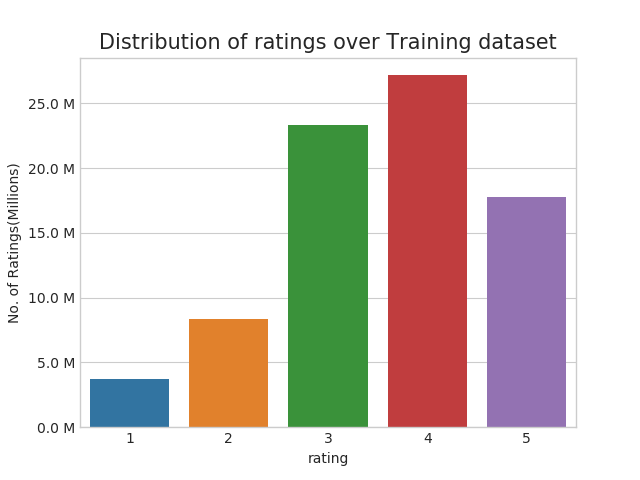

In [ ]:
fig, ax = plt.subplots()
plt.title('Distribution of ratings over Training dataset', fontsize=15)
sns.countplot(train_df.rating)
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
ax.set_ylabel('No. of Ratings(Millions)')

plt.show()

<p style="font-size:13px"> <b>Add new column (week day) to the data set  for analysis.</b></p>

In [ ]:
# It is used to skip the warning ''SettingWithCopyWarning''.. 
pd.options.mode.chained_assignment = None  # default='warn'

train_df['day_of_week'] = train_df.date.dt.weekday_name

train_df.tail()

,movie,user,rating,date,day_of_week
80384400,12074,2033618,4,2005-08-08,Monday
80384401,862,1797061,3,2005-08-08,Monday
80384402,10986,1498715,5,2005-08-08,Monday
80384403,14861,500016,4,2005-08-08,Monday
80384404,5926,1044015,5,2005-08-08,Monday


<h3> 3.3.2 Number of Ratings per a month </h3>

<IPython.core.display.Javascript object>


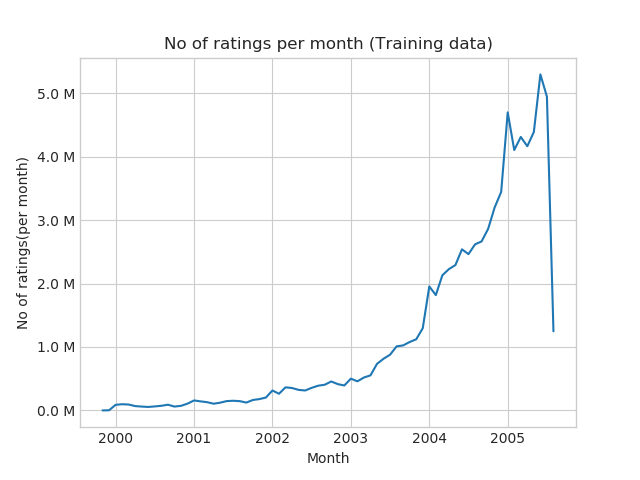

In [ ]:
ax = train_df.resample('m', on='date')['rating'].count().plot()
ax.set_title('No of ratings per month (Training data)')
plt.xlabel('Month')
plt.ylabel('No of ratings(per month)')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<h3> 3.3.3 Analysis on the Ratings given by user </h3>

In [ ]:
no_of_rated_movies_per_user = train_df.groupby(by='user')['rating'].count().sort_values(ascending=False)

no_of_rated_movies_per_user.head()

user
305344     17112
2439493    15896
387418     15402
1639792     9767
1461435     9447
Name: rating, dtype: int64

<IPython.core.display.Javascript object>


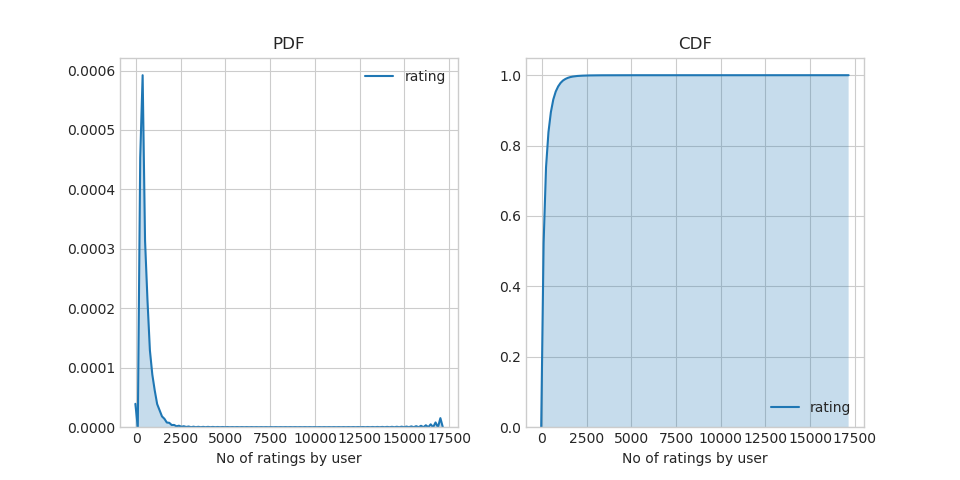

In [ ]:
fig = plt.figure(figsize=plt.figaspect(.5))

ax1 = plt.subplot(121)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, ax=ax1)
plt.xlabel('No of ratings by user')
plt.title("PDF")

ax2 = plt.subplot(122)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, cumulative=True,ax=ax2)
plt.xlabel('No of ratings by user')
plt.title('CDF')

plt.show()

In [ ]:
no_of_rated_movies_per_user.describe()

count    405041.000000
mean        198.459921
std         290.793238
min           1.000000
25%          34.000000
50%          89.000000
75%         245.000000
max       17112.000000
Name: rating, dtype: float64

> _There,  is something interesting going on with the quantiles.._

In [ ]:
quantiles = no_of_rated_movies_per_user.quantile(np.arange(0,1.01,0.01), interpolation='higher')

<IPython.core.display.Javascript object>


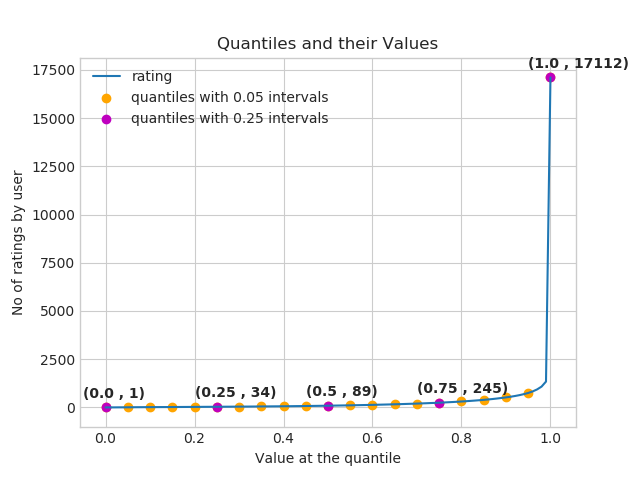

In [ ]:
plt.title("Quantiles and their Values")
quantiles.plot()
# quantiles with 0.05 difference
plt.scatter(x=quantiles.index[::5], y=quantiles.values[::5], c='orange', label="quantiles with 0.05 intervals")
# quantiles with 0.25 difference
plt.scatter(x=quantiles.index[::25], y=quantiles.values[::25], c='m', label = "quantiles with 0.25 intervals")
plt.ylabel('No of ratings by user')
plt.xlabel('Value at the quantile')
plt.legend(loc='best')

# annotate the 25th, 50th, 75th and 100th percentile values....
for x,y in zip(quantiles.index[::25], quantiles[::25]):
    plt.annotate(s="({} , {})".format(x,y), xy=(x,y), xytext=(x-0.05, y+500)
                ,fontweight='bold')


plt.show()

In [ ]:
quantiles[::5]

0.00        1
0.05        7
0.10       15
0.15       21
0.20       27
0.25       34
0.30       41
0.35       50
0.40       60
0.45       73
0.50       89
0.55      109
0.60      133
0.65      163
0.70      199
0.75      245
0.80      307
0.85      392
0.90      520
0.95      749
1.00    17112
Name: rating, dtype: int64

__how many ratings at the last 5% of all ratings__??

In [ ]:
print('\n No of ratings at last 5 percentile : {}\n'.format(sum(no_of_rated_movies_per_user>= 749)) )


 No of ratings at last 5 percentile : 20305



<h3> 3.3.4 Analysis of ratings of a movie given by a user </h3>

<IPython.core.display.Javascript object>


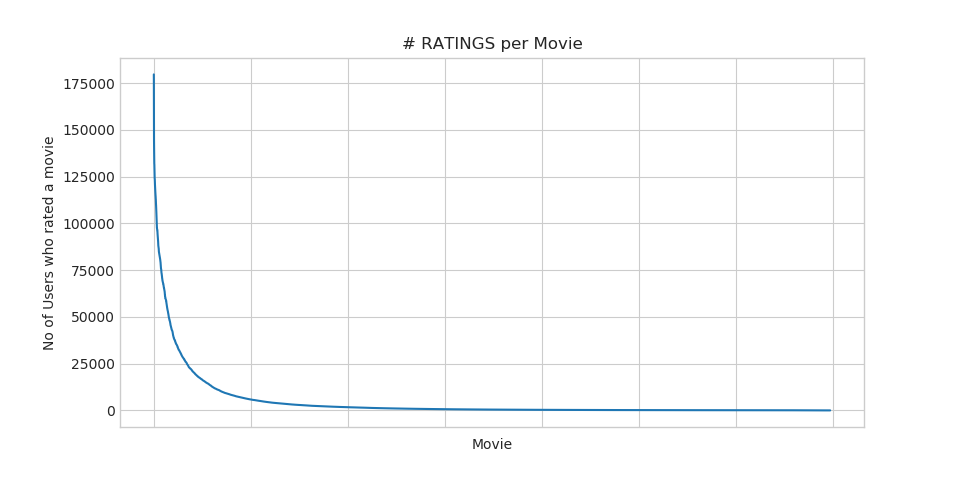

In [ ]:
no_of_ratings_per_movie = train_df.groupby(by='movie')['rating'].count().sort_values(ascending=False)

fig = plt.figure(figsize=plt.figaspect(.5))
ax = plt.gca()
plt.plot(no_of_ratings_per_movie.values)
plt.title('# RATINGS per Movie')
plt.xlabel('Movie')
plt.ylabel('No of Users who rated a movie')
ax.set_xticklabels([])

plt.show()

- __It is very skewed.. just like nunmber of ratings given per user.__
    
    
    - There are some movies (which are very popular) which are rated by huge number of users.
    
    - But most of the movies(like 90%) got some hundereds of ratings.

<h3> 3.3.5 Number of ratings on each day of the week</h3>

<IPython.core.display.Javascript object>


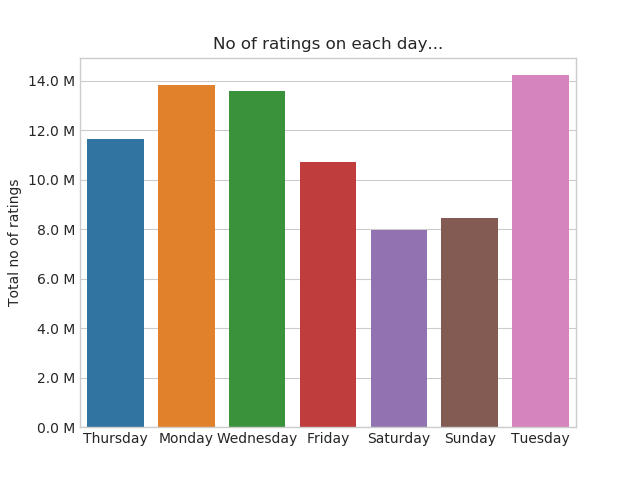

In [ ]:
fig, ax = plt.subplots()
sns.countplot(x='day_of_week', data=train_df, ax=ax)
plt.title('No of ratings on each day...')
plt.ylabel('Total no of ratings')
plt.xlabel('')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<IPython.core.display.Javascript object>


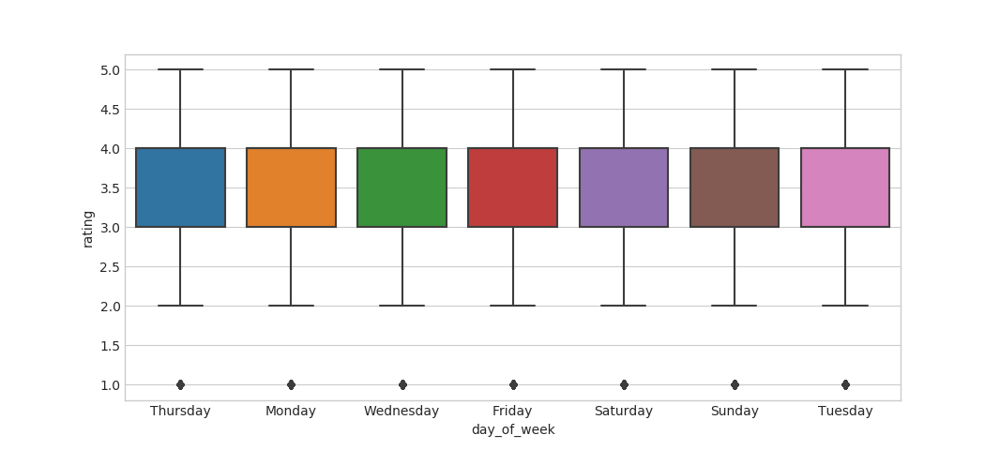

0:01:10.003761


In [ ]:
start = datetime.now()
fig = plt.figure(figsize=plt.figaspect(.45))
sns.boxplot(y='rating', x='day_of_week', data=train_df)
plt.show()
print(datetime.now() - start)

In [ ]:
avg_week_df = train_df.groupby(by=['day_of_week'])['rating'].mean()
print(" AVerage ratings")
print("-"*30)
print(avg_week_df)
print("\n")

 AVerage ratings
------------------------------
day_of_week
Friday       3.585274
Monday       3.577250
Saturday     3.591791
Sunday       3.594144
Thursday     3.582463
Tuesday      3.574438
Wednesday    3.583751
Name: rating, dtype: float64




<h3> 3.3.6 Creating sparse matrix from data frame </h3>

<table>
<tr>
<td>
<img src='images/data_c.jpg' width='250px' align=left/>
</td>
<td>
<img src='images/arrow.jpg' width='60px' align=left/>
</td>
<td>
<img src='images/data_sparse_c.jpg' width='400px' align=left/>
</td>
</tr>
</table>

<h4> 3.3.6.1 Creating sparse matrix from train data frame </h4>

In [ ]:
start = datetime.now()
if os.path.isfile('train_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    train_sparse_matrix = sparse.load_npz('train_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    train_sparse_matrix = sparse.csr_matrix((train_df.rating.values, (train_df.user.values,
                                               train_df.movie.values)),)
    
    print('Done. It\'s shape is : (user, movie) : ',train_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("train_sparse_matrix.npz", train_sparse_matrix)
    print('Done..\n')

print(datetime.now() - start)

We are creating sparse_matrix from the dataframe..
Done. It's shape is : (user, movie) :  (2649430, 17771)
Saving it into disk for furthur usage..
Done..

0:01:13.804969


<p><b>The Sparsity of Train Sparse Matrix</b></p>

In [ ]:
us,mv = train_sparse_matrix.shape
elem = train_sparse_matrix.count_nonzero()

print("Sparsity Of Train matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Train matrix : 99.8292709259195 % 


<h4> 3.3.6.2 Creating sparse matrix from test data frame </h4>

In [ ]:
start = datetime.now()
if os.path.isfile('test_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    test_sparse_matrix = sparse.load_npz('test_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    test_sparse_matrix = sparse.csr_matrix((test_df.rating.values, (test_df.user.values,
                                               test_df.movie.values)))
    
    print('Done. It\'s shape is : (user, movie) : ',test_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("test_sparse_matrix.npz", test_sparse_matrix)
    print('Done..\n')
    
print(datetime.now() - start)

We are creating sparse_matrix from the dataframe..
Done. It's shape is : (user, movie) :  (2649430, 17771)
Saving it into disk for furthur usage..
Done..

0:00:18.566120


<p><b>The Sparsity of Test data Matrix</b></p>

In [ ]:
us,mv = test_sparse_matrix.shape
elem = test_sparse_matrix.count_nonzero()

print("Sparsity Of Test matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Test matrix : 99.95731772988694 % 


<h3>3.3.7 Finding Global average of all movie ratings, Average rating per user, and Average rating per movie</h3>

In [ ]:
# get the user averages in dictionary (key: user_id/movie_id, value: avg rating)

def get_average_ratings(sparse_matrix, of_users):
    
    # average ratings of user/axes
    ax = 1 if of_users else 0 # 1 - User axes,0 - Movie axes

    # ".A1" is for converting Column_Matrix to 1-D numpy array 
    sum_of_ratings = sparse_matrix.sum(axis=ax).A1
    # Boolean matrix of ratings ( whether a user rated that movie or not)
    is_rated = sparse_matrix!=0
    # no of ratings that each user OR movie..
    no_of_ratings = is_rated.sum(axis=ax).A1
    
    # max_user  and max_movie ids in sparse matrix 
    u,m = sparse_matrix.shape
    # creae a dictonary of users and their average ratigns..
    average_ratings = { i : sum_of_ratings[i]/no_of_ratings[i]
                                 for i in range(u if of_users else m) 
                                    if no_of_ratings[i] !=0}

    # return that dictionary of average ratings
    return average_ratings

<h4> 3.3.7.1 finding global average of all movie ratings </h4>

In [ ]:
train_averages = dict()
# get the global average of ratings in our train set.
train_global_average = train_sparse_matrix.sum()/train_sparse_matrix.count_nonzero()
train_averages['global'] = train_global_average
train_averages

{'global': 3.582890686321557}

<h4> 3.3.7.2 finding average rating per user</h4>

In [ ]:
train_averages['user'] = get_average_ratings(train_sparse_matrix, of_users=True)
print('\nAverage rating of user 10 :',train_averages['user'][10])


Average rating of user 10 : 3.3781094527363185


<h4> 3.3.7.3 finding average rating per movie</h4>

In [ ]:
train_averages['movie'] =  get_average_ratings(train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15 :',train_averages['movie'][15])


 AVerage rating of movie 15 : 3.3038461538461537


<h4> 3.3.7.4 PDF's & CDF's of Avg.Ratings of Users & Movies (In Train Data)</h4>

<IPython.core.display.Javascript object>


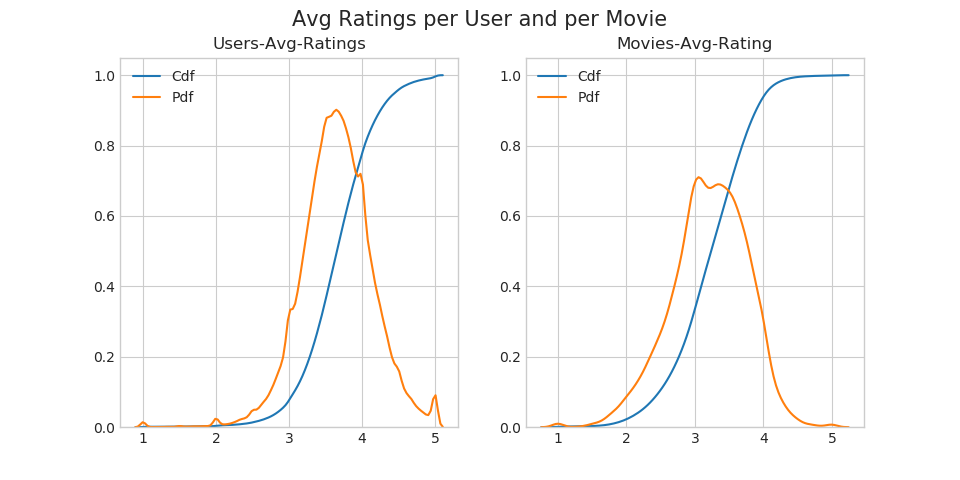

0:00:35.003443


In [ ]:
start = datetime.now()
# draw pdfs for average rating per user and average
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))
fig.suptitle('Avg Ratings per User and per Movie', fontsize=15)

ax1.set_title('Users-Avg-Ratings')
# get the list of average user ratings from the averages dictionary..
user_averages = [rat for rat in train_averages['user'].values()]
sns.distplot(user_averages, ax=ax1, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(user_averages, ax=ax1, hist=False,label='Pdf')

ax2.set_title('Movies-Avg-Rating')
# get the list of movie_average_ratings from the dictionary..
movie_averages = [rat for rat in train_averages['movie'].values()]
sns.distplot(movie_averages, ax=ax2, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(movie_averages, ax=ax2, hist=False, label='Pdf')

plt.show()
print(datetime.now() - start)

<h3> 3.3.8 Cold Start problem </h3>

<h4> 3.3.8.1 Cold Start problem with Users</h4>

In [ ]:
total_users = len(np.unique(df.user))
users_train = len(train_averages['user'])
new_users = total_users - users_train

print('\nTotal number of Users  :', total_users)
print('\nNumber of Users in Train data :', users_train)
print("\nNo of Users that didn't appear in train data: {}({} %) \n ".format(new_users,
                                                                        np.round((new_users/total_users)*100, 2)))


Total number of Users  : 480189

Number of Users in Train data : 405041

No of Users that didn't appear in train data: 75148(15.65 %) 
 


> We might have to handle __new users__ ( ___75148___ ) who didn't appear in train data.

<h4> 3.3.8.2 Cold Start problem with Movies</h4>

In [ ]:
total_movies = len(np.unique(df.movie))
movies_train = len(train_averages['movie'])
new_movies = total_movies - movies_train

print('\nTotal number of Movies  :', total_movies)
print('\nNumber of Users in Train data :', movies_train)
print("\nNo of Movies that didn't appear in train data: {}({} %) \n ".format(new_movies,
                                                                        np.round((new_movies/total_movies)*100, 2)))


Total number of Movies  : 17770

Number of Users in Train data : 17424

No of Movies that didn't appear in train data: 346(1.95 %) 
 


> We might have to handle __346 movies__ (small comparatively) in test data

<h2> 3.4 Computing Similarity matrices </h2>

<h3> 3.4.1 Computing User-User Similarity matrix </h3>

1. Calculating User User Similarity_Matrix is __not very easy__(_unless you have huge Computing Power and lots of time_) because of number of. usersbeing lare.

    * You can try if you want to. Your system could crash or the program stops with **Memory Error**


<h4> 3.4.1.1 Trying with all dimensions (17k dimensions per user) </h4>

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity


def compute_user_similarity(sparse_matrix, compute_for_few=False, top = 100, verbose=False, verb_for_n_rows = 20,
                            draw_time_taken=True):
    no_of_users, _ = sparse_matrix.shape
    # get the indices of  non zero rows(users) from our sparse matrix
    row_ind, col_ind = sparse_matrix.nonzero()
    row_ind = sorted(set(row_ind)) # we don't have to
    time_taken = list() #  time taken for finding similar users for an user..
    
    # we create rows, cols, and data lists.., which can be used to create sparse matrices
    rows, cols, data = list(), list(), list()
    if verbose: print("Computing top",top,"similarities for each user..")
    
    start = datetime.now()
    temp = 0
    
    for row in row_ind[:top] if compute_for_few else row_ind:
        temp = temp+1
        prev = datetime.now()
        
        # get the similarity row for this user with all other users
        sim = cosine_similarity(sparse_matrix.getrow(row), sparse_matrix).ravel()
        # We will get only the top ''top'' most similar users and ignore rest of them..
        top_sim_ind = sim.argsort()[-top:]
        top_sim_val = sim[top_sim_ind]
        
        # add them to our rows, cols and data
        rows.extend([row]*top)
        cols.extend(top_sim_ind)
        data.extend(top_sim_val)
        time_taken.append(datetime.now().timestamp() - prev.timestamp())
        if verbose:
            if temp%verb_for_n_rows == 0:
                print("computing done for {} users [  time elapsed : {}  ]"
                      .format(temp, datetime.now()-start))
            
        
    # lets create sparse matrix out of these and return it
    if verbose: print('Creating Sparse matrix from the computed similarities')
    #return rows, cols, data
    
    if draw_time_taken:
        plt.plot(time_taken, label = 'time taken for each user')
        plt.plot(np.cumsum(time_taken), label='Total time')
        plt.legend(loc='best')
        plt.xlabel('User')
        plt.ylabel('Time (seconds)')
        plt.show()
        
    return sparse.csr_matrix((data, (rows, cols)), shape=(no_of_users, no_of_users)), time_taken      

Computing top 100 similarities for each user..
computing done for 20 users [  time elapsed : 0:03:20.300488  ]
computing done for 40 users [  time elapsed : 0:06:38.518391  ]
computing done for 60 users [  time elapsed : 0:09:53.143126  ]
computing done for 80 users [  time elapsed : 0:13:10.080447  ]
computing done for 100 users [  time elapsed : 0:16:24.711032  ]
Creating Sparse matrix from the computed similarities


<IPython.core.display.Javascript object>


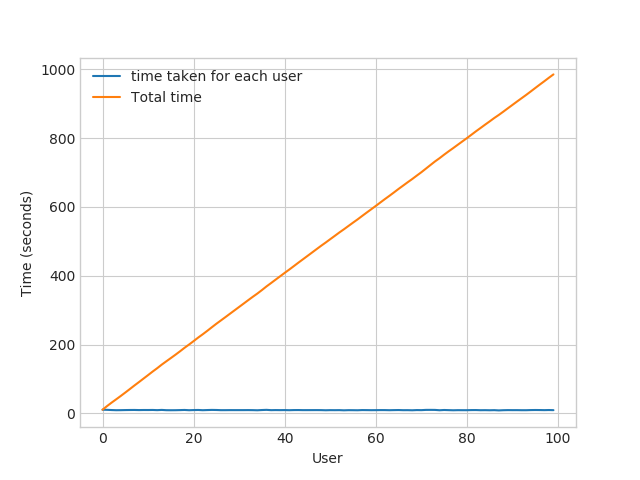

----------------------------------------------------------------------------------------------------
Time taken : 0:16:33.618931


In [ ]:
start = datetime.now()
u_u_sim_sparse, _ = compute_user_similarity(train_sparse_matrix, compute_for_few=True, top = 100,
                                                     verbose=True)
print("-"*100)
print("Time taken :",datetime.now()-start)

<h4> 3.4.1.2 Trying with reduced dimensions (Using TruncatedSVD for dimensionality reduction of user vector)</h4>

* We have  **405,041 users** in out training set and computing similarities between them..( **17K dimensional vector..**) is time consuming..


- From above plot, It took roughly __8.88 sec__ for computing simlilar users for __one user__
    
    
- We have __405,041 users__ with us in training set.


- ${ 405041 \times 8.88 = 3596764.08  \sec } =  59946.068 \min = 999.101133333 \text{ hours}
= 41.629213889 \text{ days}...$

    - Even if we run on 4 cores parallelly (a typical system now a days), It will still take almost __10 and 1/2__ days.
    
 IDEA:  Instead, we will try to reduce the dimentsions using SVD, so that __it might__ speed up the process...

In [ ]:
from datetime import datetime
from sklearn.decomposition import TruncatedSVD

start = datetime.now()

# initilaize the algorithm with some parameters..
# All of them are default except n_components. n_itr is for Randomized SVD solver.
netflix_svd = TruncatedSVD(n_components=500, algorithm='randomized', random_state=15)
trunc_svd = netflix_svd.fit_transform(train_sparse_matrix)

print(datetime.now()-start)

0:29:07.069783


Here,


- $\sum \longleftarrow$ (netflix\_svd.**singular\_values\_** )


- $\bigvee^T \longleftarrow$ (netflix\_svd.**components_**)


- $\bigcup$ is not returned. instead **Projection_of_X** onto the new vectorspace is returned. 


- It uses **randomized svd** internally, which returns **All 3 of them saperately**. Use that instead.. 

In [ ]:
expl_var = np.cumsum(netflix_svd.explained_variance_ratio_)

<IPython.core.display.Javascript object>


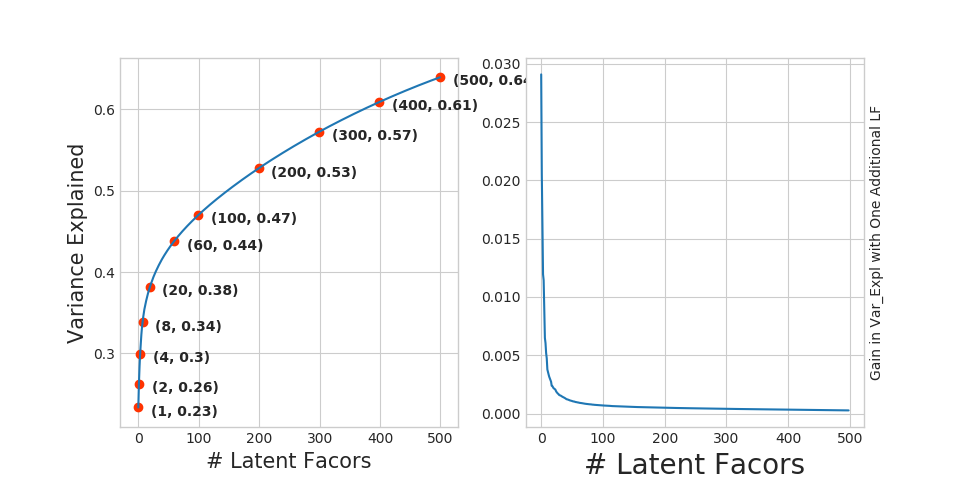

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))

ax1.set_ylabel("Variance Explained", fontsize=15)
ax1.set_xlabel("# Latent Facors", fontsize=15)
ax1.plot(expl_var)
# annote some (latentfactors, expl_var) to make it clear
ind = [1, 2,4,8,20, 60, 100, 200, 300, 400, 500]
ax1.scatter(x = [i-1 for i in ind], y = expl_var[[i-1 for i in ind]], c='#ff3300')
for i in ind:
    ax1.annotate(s ="({}, {})".format(i,  np.round(expl_var[i-1], 2)), xy=(i-1, expl_var[i-1]),
                xytext = ( i+20, expl_var[i-1] - 0.01), fontweight='bold')

change_in_expl_var = [expl_var[i+1] - expl_var[i] for i in range(len(expl_var)-1)]
ax2.plot(change_in_expl_var)



ax2.set_ylabel("Gain in Var_Expl with One Additional LF", fontsize=10)
ax2.yaxis.set_label_position("right")
ax2.set_xlabel("# Latent Facors", fontsize=20)

plt.show()

In [ ]:
for i in ind:
    print("({}, {})".format(i, np.round(expl_var[i-1], 2)))

(1, 0.23)
(2, 0.26)
(4, 0.3)
(8, 0.34)
(20, 0.38)
(60, 0.44)
(100, 0.47)
(200, 0.53)
(300, 0.57)
(400, 0.61)
(500, 0.64)


 
> I think 500 dimensions is good enough 

---------

-  By just taking __(20 to 30)__ latent factors, explained variance that we could get is __20 %__. 

- To take it to __60%__, we have to take  __almost 400 latent factors__. It is not fare.



- It basically is the __gain of variance explained__, if we ___add one additional latent factor to it.___


- By adding one by one latent factore too it, the ___gain in expained variance__ with that addition is decreasing. (Obviously, because they are sorted that way).
- ___LHS Graph___:
    - __x__ --- ( No of latent factos ),
    - __y__ --- ( The variance explained by taking x latent factors)



- __More decrease in the line (RHS graph) __:
    - We  are getting more expained variance than before.
- __Less decrease in that line (RHS graph)__  :
    - We are not getting benifitted from adding latent factor furthur. This is what is shown in the plots.


- ___RHS Graph___:
    - __x__ --- ( No of latent factors ),
    - __y__ --- ( Gain n Expl_Var by taking one additional latent factor) 

In [ ]:
# Let's project our Original U_M matrix into into 500 Dimensional space...
start = datetime.now()
trunc_matrix = train_sparse_matrix.dot(netflix_svd.components_.T)
print(datetime.now()- start)

0:00:45.670265


In [ ]:
type(trunc_matrix), trunc_matrix.shape

(numpy.ndarray, (2649430, 500))

* Let's convert this to actual sparse matrix and store it for future purposes

In [ ]:
if not os.path.isfile('trunc_sparse_matrix.npz'):
    # create that sparse sparse matrix
    trunc_sparse_matrix = sparse.csr_matrix(trunc_matrix)
    # Save this truncated sparse matrix for later usage..
    sparse.save_npz('trunc_sparse_matrix', trunc_sparse_matrix)
else:
    trunc_sparse_matrix = sparse.load_npz('trunc_sparse_matrix.npz')

In [ ]:
trunc_sparse_matrix.shape

(2649430, 500)

Computing top 50 similarities for each user..
computing done for 10 users [  time elapsed : 0:02:09.746324  ]
computing done for 20 users [  time elapsed : 0:04:16.017768  ]
computing done for 30 users [  time elapsed : 0:06:20.861163  ]
computing done for 40 users [  time elapsed : 0:08:24.933316  ]
computing done for 50 users [  time elapsed : 0:10:28.861485  ]
Creating Sparse matrix from the computed similarities


<IPython.core.display.Javascript object>


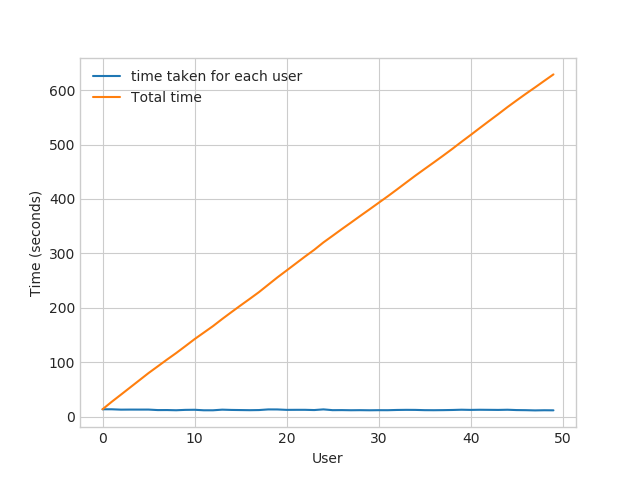

--------------------------------------------------
time: 0:10:52.658092


In [ ]:
start = datetime.now()
trunc_u_u_sim_matrix, _ = compute_user_similarity(trunc_sparse_matrix, compute_for_few=True, top=50, verbose=True, 
                                                 verb_for_n_rows=10)
print("-"*50)
print("time:",datetime.now()-start)

**: This is taking more time for each user than Original one.**

- from above plot, It took almost __12.18__ for computing simlilar users for __one user__
    
    
- We have __405041 users__ with us in training set.


- ${ 405041 \times 12.18 ==== 4933399.38 \sec } ====  82223.323 \min ==== 1370.388716667 \text{ hours}
==== 57.099529861 \text{ days}...$

    - Even we run on 4 cores parallelly (a typical system now a days), It will still take almost __(14 - 15) __ days.


- __Why did this happen...??__


    - Just think about it. It's not that difficult.

---------------------------------_( sparse & dense..................get it ?? )_-----------------------------------

__Is there any other way to compute user user similarity..??__

-An alternative is to compute similar users for a particular user,  whenenver required (**ie., Run time**)
    - We maintain a binary Vector for users, which tells us whether we already computed or not..
    - ***If not*** : 
        - Compute top (let's just say, 1000) most similar users for this given user, and add this to our datastructure, so that we can just access it(similar users) without recomputing it again.
        - 
    - ***If It is already Computed***:
        - Just get it directly from our datastructure, which has that information.
        - In production time, We might have to recompute similarities, if it is computed a long time ago. Because user preferences changes over time. If we could maintain some kind of Timer, which when expires, we have to update it ( recompute it ). 
        - 
    - ***Which datastructure to use:***
        - It is purely implementation dependant. 
        - One simple method is to maintain a **Dictionary Of Dictionaries**.
            - 
            - **key    :** _userid_ 
            - __value__: _Again a dictionary_
                - __key__  : _Similar User_
                - __value__: _Similarity Value_

<h3> 3.4.2 Computing Movie-Movie Similarity matrix </h3>

In [ ]:
start = datetime.now()
if not os.path.isfile('m_m_sim_sparse.npz'):
    print("It seems you don't have that file. Computing movie_movie similarity...")
    start = datetime.now()
    m_m_sim_sparse = cosine_similarity(X=train_sparse_matrix.T, dense_output=False)
    print("Done..")
    # store this sparse matrix in disk before using it. For future purposes.
    print("Saving it to disk without the need of re-computing it again.. ")
    sparse.save_npz("m_m_sim_sparse.npz", m_m_sim_sparse)
    print("Done..")
else:
    print("It is there, We will get it.")
    m_m_sim_sparse = sparse.load_npz("m_m_sim_sparse.npz")
    print("Done ...")

print("It's a ",m_m_sim_sparse.shape," dimensional matrix")

print(datetime.now() - start)

It seems you don't have that file. Computing movie_movie similarity...
Done..
Saving it to disk without the need of re-computing it again.. 
Done..
It's a  (17771, 17771)  dimensional matrix
0:10:02.736054


In [ ]:
m_m_sim_sparse.shape

(17771, 17771)

- Even though we have similarity measure of each movie, with all other movies, We generally don't care much about least similar movies.


- Most of the times, only top_xxx similar items matters. It may be 10 or 100.


- We take only those top similar movie ratings and store them  in a saperate dictionary.

In [ ]:
movie_ids = np.unique(m_m_sim_sparse.nonzero()[1])

In [ ]:
start = datetime.now()
similar_movies = dict()
for movie in movie_ids:
    # get the top similar movies and store them in the dictionary
    sim_movies = m_m_sim_sparse[movie].toarray().ravel().argsort()[::-1][1:]
    similar_movies[movie] = sim_movies[:100]
print(datetime.now() - start)

# just testing similar movies for movie_15
similar_movies[15]

0:00:33.411700


array([ 8279,  8013, 16528,  5927, 13105, 12049,  4424, 10193, 17590,
        4549,  3755,   590, 14059, 15144, 15054,  9584,  9071,  6349,
       16402,  3973,  1720,  5370, 16309,  9376,  6116,  4706,  2818,
         778, 15331,  1416, 12979, 17139, 17710,  5452,  2534,   164,
       15188,  8323,  2450, 16331,  9566, 15301, 13213, 14308, 15984,
       10597,  6426,  5500,  7068,  7328,  5720,  9802,   376, 13013,
        8003, 10199,  3338, 15390,  9688, 16455, 11730,  4513,   598,
       12762,  2187,   509,  5865,  9166, 17115, 16334,  1942,  7282,
       17584,  4376,  8988,  8873,  5921,  2716, 14679, 11947, 11981,
        4649,   565, 12954, 10788, 10220, 10963,  9427,  1690,  5107,
        7859,  5969,  1510,  2429,   847,  7845,  6410, 13931,  9840,
        3706])

<h3> 3.4.3 Finding most similar movies using similarity matrix </h3>

__ Does Similarity really works as the way we expected...? __ <br>
_Let's pick some random movie and check for its similar movies...._

In [ ]:
# First Let's load the movie details into soe dataframe..
# movie details are in 'netflix/movie_titles.csv'

movie_titles = pd.read_csv("data_folder/movie_titles.csv", sep=',', header = None,
                           names=['movie_id', 'year_of_release', 'title'], verbose=True,
                      index_col = 'movie_id', encoding = "ISO-8859-1")

movie_titles.head()

Tokenization took: 4.50 ms
Type conversion took: 165.72 ms
Parser memory cleanup took: 0.01 ms


,year_of_release,title
movie_id,,
1,2003.0,Dinosaur Planet
2,2004.0,Isle of Man TT 2004 Review
3,1997.0,Character
4,1994.0,Paula Abdul's Get Up & Dance
5,2004.0,The Rise and Fall of ECW


<p style='font-size:15px'><b>Similar Movies for 'Vampire Journals'</b></p>

In [ ]:
mv_id = 67

print("\nMovie ----->",movie_titles.loc[mv_id].values[1])

print("\nIt has {} Ratings from users.".format(train_sparse_matrix[:,mv_id].getnnz()))

print("\nWe have {} movies which are similarto this  and we will get only top most..".format(m_m_sim_sparse[:,mv_id].getnnz()))


Movie -----> Vampire Journals

It has 270 Ratings from users.

We have 17284 movies which are similarto this  and we will get only top most..


In [ ]:
similarities = m_m_sim_sparse[mv_id].toarray().ravel()

similar_indices = similarities.argsort()[::-1][1:]

similarities[similar_indices]

sim_indices = similarities.argsort()[::-1][1:] # It will sort and reverse the array and ignore its similarity (ie.,1)
                                               # and return its indices(movie_ids)

<IPython.core.display.Javascript object>


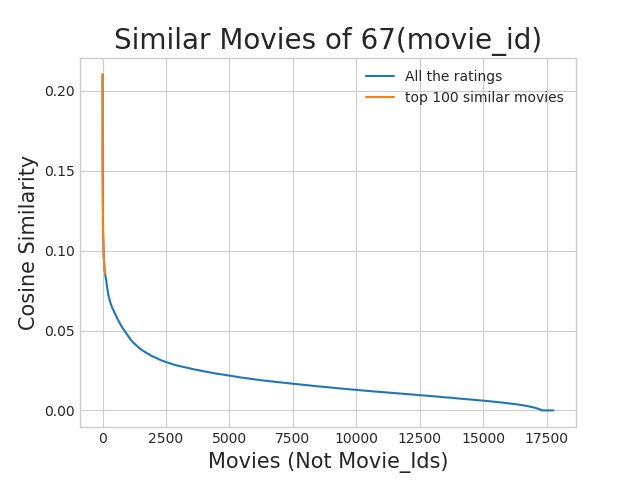

In [ ]:
plt.plot(similarities[sim_indices], label='All the ratings')
plt.plot(similarities[sim_indices[:100]], label='top 100 similar movies')
plt.title("Similar Movies of {}(movie_id)".format(mv_id), fontsize=20)
plt.xlabel("Movies (Not Movie_Ids)", fontsize=15)
plt.ylabel("Cosine Similarity",fontsize=15)
plt.legend()
plt.show()

__Top 10 similar movies__

In [ ]:
movie_titles.loc[sim_indices[:10]]

,year_of_release,title
movie_id,,
323,1999.0,Modern Vampires
4044,1998.0,Subspecies 4: Bloodstorm
1688,1993.0,To Sleep With a Vampire
13962,2001.0,Dracula: The Dark Prince
12053,1993.0,Dracula Rising
16279,2002.0,Vampires: Los Muertos
4667,1996.0,Vampirella
1900,1997.0,Club Vampire
13873,2001.0,The Breed


 > Similarly, we can ___find similar users___ and compare how similar they are. 

 <h1> 4.  Machine Learning Models </h1>

<img src='images/models.jpg' width=500px>

In [ ]:
def get_sample_sparse_matrix(sparse_matrix, no_users, no_movies, path, verbose = True):
    """
        It will get it from the ''path'' if it is present  or It will create 
        and store the sampled sparse matrix in the path specified.
    """

    # get (row, col) and (rating) tuple from sparse_matrix...
    row_ind, col_ind, ratings = sparse.find(sparse_matrix)
    users = np.unique(row_ind)
    movies = np.unique(col_ind)

    print("Original Matrix : (users, movies) -- ({} {})".format(len(users), len(movies)))
    print("Original Matrix : Ratings -- {}\n".format(len(ratings)))

    # It just to make sure to get same sample everytime we run this program..
    # and pick without replacement....
    np.random.seed(15)
    sample_users = np.random.choice(users, no_users, replace=False)
    sample_movies = np.random.choice(movies, no_movies, replace=False)
    # get the boolean mask or these sampled_items in originl row/col_inds..
    mask = np.logical_and( np.isin(row_ind, sample_users),
                      np.isin(col_ind, sample_movies) )
    
    sample_sparse_matrix = sparse.csr_matrix((ratings[mask], (row_ind[mask], col_ind[mask])),
                                             shape=(max(sample_users)+1, max(sample_movies)+1))

    if verbose:
        print("Sampled Matrix : (users, movies) -- ({} {})".format(len(sample_users), len(sample_movies)))
        print("Sampled Matrix : Ratings --", format(ratings[mask].shape[0]))

    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz(path, sample_sparse_matrix)
    if verbose:
            print('Done..\n')
    
    return sample_sparse_matrix

<h2> 4.1 Sampling Data </h2>

<h3>4.1.1 Build sample train data from the train data</h3>

In [ ]:
start = datetime.now()
path = "sample/small/sample_train_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_train_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else: 
    # get 10k users and 1k movies from available data 
    sample_train_sparse_matrix = get_sample_sparse_matrix(train_sparse_matrix, no_users=10000, no_movies=1000,
                                             path = path)

print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:00.035179


<h3>4.1.2 Build sample test data from the test data</h3>

In [ ]:
start = datetime.now()

path = "sample/small/sample_test_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_test_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else:
    # get 5k users and 500 movies from available data 
    sample_test_sparse_matrix = get_sample_sparse_matrix(test_sparse_matrix, no_users=5000, no_movies=500,
                                                 path = "sample/small/sample_test_sparse_matrix.npz")
print(datetime.now() - start)

It is present in your pwd, getting it from disk....
DONE..
0:00:00.028740


<h2>4.2 Finding Global Average of all movie ratings, Average rating per User, and Average rating per Movie (from sampled train)</h2>

In [ ]:
sample_train_averages = dict()

<h3>4.2.1 Finding Global Average of all movie ratings</h3>

In [ ]:
# get the global average of ratings in our train set.
global_average = sample_train_sparse_matrix.sum()/sample_train_sparse_matrix.count_nonzero()
sample_train_averages['global'] = global_average
sample_train_averages

{'global': 3.581679377504138}

<h3>4.2.2 Finding Average rating per User</h3>

In [ ]:
sample_train_averages['user'] = get_average_ratings(sample_train_sparse_matrix, of_users=True)
print('\nAverage rating of user 1515220 :',sample_train_averages['user'][1515220])


Average rating of user 1515220 : 3.9655172413793105


<h3>4.2.3 Finding Average rating per Movie</h3>

In [ ]:
sample_train_averages['movie'] =  get_average_ratings(sample_train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15153 :',sample_train_averages['movie'][15153])


 AVerage rating of movie 15153 : 2.6458333333333335


<h2> 4.3 Featurizing data </h2>

In [ ]:
print('\n No of ratings in Our Sampled train matrix is : {}\n'.format(sample_train_sparse_matrix.count_nonzero()))
print('\n No of ratings in Our Sampled test  matrix is : {}\n'.format(sample_test_sparse_matrix.count_nonzero()))


 No of ratings in Our Sampled train matrix is : 129286


 No of ratings in Our Sampled test  matrix is : 7333



<h3> 4.3.1 Featurizing data for regression problem </h3>

<h4> 4.3.1.1 Featurizing train data </h4>

In [ ]:
# get users, movies and ratings from our samples train sparse matrix
sample_train_users, sample_train_movies, sample_train_ratings = sparse.find(sample_train_sparse_matrix)

In [ ]:
############################################################
# It took me almost 10 hours to prepare this train dataset.#
############################################################
start = datetime.now()
if os.path.isfile('sample/small/reg_train.csv'):
    print("File already exists you don't have to prepare again..." )
else:
    print('preparing {} tuples for the dataset..\n'.format(len(sample_train_ratings)))
    with open('sample/small/reg_train.csv', mode='w') as reg_data_file:
        count = 0
        for (user, movie, rating)  in zip(sample_train_users, sample_train_movies, sample_train_ratings):
            st = datetime.now()
        #     print(user, movie)    
            #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            # compute the similar Users of the "user"        
            user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
            top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar users for this movie
            top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
            # we will make it's length "5" by adding movie averages to .
            top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
        #     print(top_sim_users_ratings, end=" ")    


            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            # compute the similar movies of the "movie"        
            movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
            top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar movie rated by this user..
            top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
            # we will make it's length "5" by adding user averages to.
            top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
        #     print(top_sim_movies_ratings, end=" : -- ")

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            row.append(user)
            row.append(movie)
            # Now add the other features to this data...
            row.append(sample_train_averages['global']) # first feature
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            # Avg_user rating
            row.append(sample_train_averages['user'][user])
            # Avg_movie rating
            row.append(sample_train_averages['movie'][movie])

            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            count = count + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%10000 == 0:
                # print(','.join(map(str, row)))
                print("Done for {} rows----- {}".format(count, datetime.now() - start))


print(datetime.now() - start)

preparing 129286 tuples for the dataset..

Done for 10000 rows----- 0:53:13.974716
Done for 20000 rows----- 1:47:58.228942
Done for 30000 rows----- 2:42:46.963119
Done for 40000 rows----- 3:36:44.807894
Done for 50000 rows----- 4:28:55.311500
Done for 60000 rows----- 5:24:18.493104
Done for 70000 rows----- 6:17:39.669922
Done for 80000 rows----- 7:11:23.970879
Done for 90000 rows----- 8:05:33.787770
Done for 100000 rows----- 9:00:25.463562
Done for 110000 rows----- 9:51:28.530010
Done for 120000 rows----- 10:42:05.382141
11:30:13.699183


__Reading from the file to make a Train_dataframe__

In [ ]:
reg_train = pd.read_csv('/gdrive/My Drive/Netflix Prize/Copy of reg_train.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5','smr1', 'smr2', 'smr3', 'smr4', 'smr5', 'UAvg', 'MAvg', 'rating'], header=None)
reg_train.head()

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3
2,99865,33,3.581679,5.0,5.0,4.0,5.0,3.0,5.0,4.0,4.0,5.0,4.0,3.714286,4.092437,5
3,101620,33,3.581679,2.0,3.0,5.0,5.0,4.0,4.0,3.0,3.0,4.0,5.0,3.584416,4.092437,5
4,112974,33,3.581679,5.0,5.0,5.0,5.0,5.0,3.0,5.0,5.0,5.0,3.0,3.750000,4.092437,5


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 similar users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 similar movies rated by this movie.. )


- __UAvg__ : User's Average rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h4> 4.3.1.2 Featurizing test data </h4>

In [ ]:
# get users, movies and ratings from the Sampled Test 
sample_test_users, sample_test_movies, sample_test_ratings = sparse.find(sample_test_sparse_matrix)

In [ ]:
sample_train_averages['global']

3.581679377504138

In [ ]:
start = datetime.now()

if os.path.isfile('sample/small/reg_test.csv'):
    print("It is already created...")
else:

    print('preparing {} tuples for the dataset..\n'.format(len(sample_test_ratings)))
    with open('sample/small/reg_test.csv', mode='w') as reg_data_file:
        count = 0 
        for (user, movie, rating)  in zip(sample_test_users, sample_test_movies, sample_test_ratings):
            st = datetime.now()

        #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            #print(user, movie)
            try:
                # compute the similar Users of the "user"        
                user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
                top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar users for this movie
                top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
                # we will make it's length "5" by adding movie averages to .
                top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
                # print(top_sim_users_ratings, end="--")

            except (IndexError, KeyError):
                # It is a new User or new Movie or there are no ratings for given user for top similar movies...
                ########## Cold STart Problem ##########
                top_sim_users_ratings.extend([sample_train_averages['global']]*(5 - len(top_sim_users_ratings)))
                #print(top_sim_users_ratings)
            except:
                print(user, movie)
                # we just want KeyErrors to be resolved. Not every Exception...
                raise



            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            try:
                # compute the similar movies of the "movie"        
                movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
                top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar movie rated by this user..
                top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
                # we will make it's length "5" by adding user averages to.
                top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
                #print(top_sim_movies_ratings)
            except (IndexError, KeyError):
                #print(top_sim_movies_ratings, end=" : -- ")
                top_sim_movies_ratings.extend([sample_train_averages['global']]*(5-len(top_sim_movies_ratings)))
                #print(top_sim_movies_ratings)
            except :
                raise

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            # add usser and movie name first
            row.append(user)
            row.append(movie)
            row.append(sample_train_averages['global']) # first feature
            #print(row)
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            #print(row)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            #print(row)
            # Avg_user rating
            try:
                row.append(sample_train_averages['user'][user])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # Avg_movie rating
            try:
                row.append(sample_train_averages['movie'][movie])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            #print(row)
            count = count + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            #print(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%1000 == 0:
                #print(','.join(map(str, row)))
                print("Done for {} rows----- {}".format(count, datetime.now() - start))
    print("",datetime.now() - start)  

preparing 7333 tuples for the dataset..

Done for 1000 rows----- 0:04:29.293783
Done for 2000 rows----- 0:08:57.208002
Done for 3000 rows----- 0:13:30.333223
Done for 4000 rows----- 0:18:04.050813
Done for 5000 rows----- 0:22:38.671673
Done for 6000 rows----- 0:27:09.697009
Done for 7000 rows----- 0:31:41.933568
 0:33:12.529731


__Reading from the file to make a test dataframe __

In [ ]:
reg_test_df = pd.read_csv('/gdrive/My Drive/Netflix Prize/Copy of reg_test.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5',
                                                          'smr1', 'smr2', 'smr3', 'smr4', 'smr5',
                                                          'UAvg', 'MAvg', 'rating'], header=None)
reg_test_df.head(4)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4
2,1737912,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3
3,1849204,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 simiular users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 simiular movies rated by this movie.. )


- __UAvg__ : User AVerage rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h3> 4.3.2 Transforming data for Surprise models</h3>

In [ ]:
!pip install surprise

     |████████████████████████████████| 6.5MB 2.7MB/s 
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.0-cp36-cp36m-linux_x86_64.whl size=1675717 sha256=77c04fe1e129a2da68deafdf2d6b8570f7ccdfc1c3e571522ab9f44e6e76fb46
  Stored in directory: /root/.cache/pip/wheels/cc/fa/8c/16c93fccce688ae1bde7d979ff102f7bee980d9cfeb8641bcf
Successfully built scikit-surprise


In [ ]:
from surprise import Reader, Dataset

<h4> 4.3.2.1 Transforming train data </h4>

- We can't give raw data (movie, user, rating) to train the model in Surprise library.


- They have a saperate format for TRAIN and TEST data, which will be useful for training the models like SVD, KNNBaseLineOnly....etc..,in Surprise.


- We can form the trainset from a file, or from a Pandas  DataFrame. 
http://surprise.readthedocs.io/en/stable/getting_started.html#load-dom-dataframe-py 

In [ ]:
# It is to specify how to read the dataframe.
# for our dataframe, we don't have to specify anything extra..
reader = Reader(rating_scale=(1,5))

# create the traindata from the dataframe...
train_data = Dataset.load_from_df(reg_train[['user', 'movie', 'rating']], reader)

# build the trainset from traindata.., It is of dataset format from surprise library..
trainset = train_data.build_full_trainset() 

<h4> 4.3.2.2 Transforming test data </h4>

- Testset is just a list of (user, movie, rating) tuples. (Order in the tuple is impotant) 

In [ ]:
testset = list(zip(reg_test_df.user.values, reg_test_df.movie.values, reg_test_df.rating.values))
testset[:3]

[(808635, 71, 5), (941866, 71, 4), (1737912, 71, 3)]

<h2> 4.4 Applying Machine Learning models </h2>

-  Global dictionary that stores rmse and mape for all the models....

    - It stores the metrics in a dictionary of dictionaries

    > __keys__ : model names(string)

    > __value__: dict(__key__ : metric, __value__ : value ) 

In [ ]:
models_evaluation_train = dict()
models_evaluation_test = dict()

models_evaluation_train, models_evaluation_test

({}, {})

 > __Utility functions for running regression models__

In [ ]:
# to get rmse and mape given actual and predicted ratings..
def get_error_metrics(y_true, y_pred):
    rmse = np.sqrt(np.mean([ (y_true[i] - y_pred[i])**2 for i in range(len(y_pred)) ]))
    mape = np.mean(np.abs( (y_true - y_pred)/y_true )) * 100
    return rmse, mape

###################################################################
###################################################################
def run_xgboost(algo,  x_train, y_train, x_test, y_test, verbose=True):
    """
    It will return train_results and test_results
    """
    
    # dictionaries for storing train and test results
    train_results = dict()
    test_results = dict()
    
    
    # fit the model
    print('Training the model..')
    start =datetime.now()
    algo.fit(x_train, y_train, eval_metric = 'rmse')
    print('Done. Time taken : {}\n'.format(datetime.now()-start))
    print('Done \n')

    # from the trained model, get the predictions....
    print('Evaluating the model with TRAIN data...')
    start =datetime.now()
    y_train_pred = algo.predict(x_train)
    # get the rmse and mape of train data...
    rmse_train, mape_train = get_error_metrics(y_train.values, y_train_pred)
    
    # store the results in train_results dictionary..
    train_results = {'rmse': rmse_train,
                    'mape' : mape_train,
                    'predictions' : y_train_pred}
    
    #######################################
    # get the test data predictions and compute rmse and mape
    print('Evaluating Test data')
    y_test_pred = algo.predict(x_test) 
    rmse_test, mape_test = get_error_metrics(y_true=y_test.values, y_pred=y_test_pred)
    # store them in our test results dictionary.
    test_results = {'rmse': rmse_test,
                    'mape' : mape_test,
                    'predictions':y_test_pred}
    if verbose:
        print('\nTEST DATA')
        print('-'*30)
        print('RMSE : ', rmse_test)
        print('MAPE : ', mape_test)
        
    # return these train and test results...
    return train_results, test_results
    

> __Utility functions for Surprise modes__

In [ ]:
# it is just to makesure that all of our algorithms should produce same results
# everytime they run...

my_seed = 15
random.seed(my_seed)
np.random.seed(my_seed)

##########################################################
# get  (actual_list , predicted_list) ratings given list 
# of predictions (prediction is a class in Surprise).    
##########################################################
def get_ratings(predictions):
    actual = np.array([pred.r_ui for pred in predictions])
    pred = np.array([pred.est for pred in predictions])
    
    return actual, pred

################################################################
# get ''rmse'' and ''mape'' , given list of prediction objecs 
################################################################
def get_errors(predictions, print_them=False):

    actual, pred = get_ratings(predictions)
    rmse = np.sqrt(np.mean((pred - actual)**2))
    mape = np.mean(np.abs(pred - actual)/actual)

    return rmse, mape*100

##################################################################################
# It will return predicted ratings, rmse and mape of both train and test data   #
##################################################################################
def run_surprise(algo, trainset, testset, verbose=True): 
    '''
        return train_dict, test_dict
    
        It returns two dictionaries, one for train and the other is for test
        Each of them have 3 key-value pairs, which specify ''rmse'', ''mape'', and ''predicted ratings''.
    '''
    start = datetime.now()
    # dictionaries that stores metrics for train and test..
    train = dict()
    test = dict()
    
    # train the algorithm with the trainset
    st = datetime.now()
    print('Training the model...')
    algo.fit(trainset)
    print('Done. time taken : {} \n'.format(datetime.now()-st))
    
    # ---------------- Evaluating train data--------------------#
    st = datetime.now()
    print('Evaluating the model with train data..')
    # get the train predictions (list of prediction class inside Surprise)
    train_preds = algo.test(trainset.build_testset())
    # get predicted ratings from the train predictions..
    train_actual_ratings, train_pred_ratings = get_ratings(train_preds)
    # get ''rmse'' and ''mape'' from the train predictions.
    train_rmse, train_mape = get_errors(train_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Train Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(train_rmse, train_mape))
    
    #store them in the train dictionary
    if verbose:
        print('adding train results in the dictionary..')
    train['rmse'] = train_rmse
    train['mape'] = train_mape
    train['predictions'] = train_pred_ratings
    
    #------------ Evaluating Test data---------------#
    st = datetime.now()
    print('\nEvaluating for test data...')
    # get the predictions( list of prediction classes) of test data
    test_preds = algo.test(testset)
    # get the predicted ratings from the list of predictions
    test_actual_ratings, test_pred_ratings = get_ratings(test_preds)
    # get error metrics from the predicted and actual ratings
    test_rmse, test_mape = get_errors(test_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Test Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(test_rmse, test_mape))
    # store them in test dictionary
    if verbose:
        print('storing the test results in test dictionary...')
    test['rmse'] = test_rmse
    test['mape'] = test_mape
    test['predictions'] = test_pred_ratings
    
    print('\n'+'-'*45)
    print('Total time taken to run this algorithm :', datetime.now() - start)
    
    # return two dictionaries train and test
    return train, test

<h3> 4.4.1 XGBoost with initial 13 features with Hyperparameter tuned</h3>

In [ ]:
import xgboost as xgb

In [ ]:
import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import time
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']
# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# this code is taken fromhttps://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d
n_estimators = [10, 50, 100, 150, 200, 300, 500, 1000]
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# train_auc = []
# cv_auc = []
for i in tqdm(n_estimators):
    for j in tqdm(max_depth):
        count=1
        first_xgb = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=i, max_depth=j)
        train_results, test_results = run_xgboost(first_xgb, x_train, y_train, x_test, y_test)
        print("esimators: ", i)
        print("depth: ", j)
        
        models_evaluation_train[count] = train_results
        models_evaluation_test[count] = test_results

        xgb.plot_importance(first_xgb)
        plt.show()


 

  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:16:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.571774

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5612059763007227
MAPE :  38.42165365284793
esimators:  10
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:01<00:08,  1.09s/it]

Training the model..
[10:16:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.673536

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5990506932965267
MAPE :  39.11867046747442
esimators:  10
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:02<00:07,  1.13s/it]

Training the model..
[10:16:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.829995

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5650355518103993
MAPE :  38.48241035933061
esimators:  10
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:03<00:07,  1.21s/it]

Training the model..
[10:16:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.015663

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5368756983786482
MAPE :  37.95156720475861
esimators:  10
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:05<00:06,  1.32s/it]

Training the model..
[10:16:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.220622

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5510625187614944
MAPE :  38.21835748325332
esimators:  10
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:07<00:05,  1.46s/it]

Training the model..
[10:16:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.458615

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5571523931144862
MAPE :  38.32750889129371
esimators:  10
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:09<00:04,  1.63s/it]

Training the model..
[10:16:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.738752

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5259080322822443
MAPE :  37.740000419722044
esimators:  10
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:11<00:03,  1.84s/it]

Training the model..
[10:16:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.049124

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5310380739306453
MAPE :  37.837578467393094
esimators:  10
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:14<00:02,  2.11s/it]

Training the model..
[10:16:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.321390

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5110529335794003
MAPE :  37.44708278026465
esimators:  10
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:16:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.122846

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753828457100834
MAPE :  34.5547343559214
esimators:  50
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:02<00:22,  2.79s/it]

Training the model..
[10:16:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.810106

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0775164473137477
MAPE :  34.372888201935474
esimators:  50
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:06<00:20,  2.99s/it]

Training the model..
[10:16:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.659445

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0767003143448937
MAPE :  34.44272402086184
esimators:  50
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:10<00:20,  3.40s/it]

Training the model..
[10:16:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.681063

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0763084234150897
MAPE :  34.48079664645734
esimators:  50
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:16<00:20,  4.00s/it]

Training the model..
[10:16:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.905798

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.089667995875608
MAPE :  33.75657802939692
esimators:  50
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:22<00:19,  4.82s/it]

Training the model..
[10:17:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.169491

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.097205256204943
MAPE :  33.48581678791802
esimators:  50
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:30<00:17,  5.77s/it]

Training the model..
[10:17:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.508985

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1030258439994727
MAPE :  33.3165789040128
esimators:  50
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:40<00:13,  6.86s/it]

Training the model..
[10:17:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.967808

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1433643236319182
MAPE :  32.34642727509743
esimators:  50
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:51<00:08,  8.07s/it]

Training the model..
[10:17:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.308981

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1093314071629259
MAPE :  33.146495296552054
esimators:  50
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:17:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.101893

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075242084885106
MAPE :  34.590251824222776
esimators:  100
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:04<00:38,  4.81s/it]

Training the model..
[10:17:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.506238

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076373581778953
MAPE :  34.48223172520999
esimators:  100
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:11<00:36,  5.25s/it]

Training the model..
[10:17:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.093928

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0760339030367996
MAPE :  34.51989787384306
esimators:  100
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:19<00:36,  6.07s/it]

Training the model..
[10:18:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.166806

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755881866540673
MAPE :  34.55557960993355
esimators:  100
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:29<00:36,  7.29s/it]

Training the model..
[10:18:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.365394

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0859752804049099
MAPE :  33.918792788096624
esimators:  100
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:41<00:35,  8.84s/it]

Training the model..
[10:18:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.749483

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0993102143211242
MAPE :  33.41973322755375
esimators:  100
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:56<00:31, 10.66s/it]

Training the model..
[10:18:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.477421

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.10325767745069
MAPE :  33.31077257483281
esimators:  100
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:14<00:25, 12.78s/it]

Training the model..
[10:18:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.085367

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1434192334686686
MAPE :  32.34663856284739
esimators:  100
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:34<00:15, 15.09s/it]

Training the model..
[10:19:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:21.926813

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1258440697325327
MAPE :  32.74192999143959
esimators:  100
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:19:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.083173

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752922997174124
MAPE :  34.59419928581543
esimators:  150
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:06<00:55,  6.88s/it]

Training the model..
[10:19:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.964191

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0763692338409443
MAPE :  34.48738240741579
esimators:  150
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:15<00:52,  7.48s/it]

Training the model..
[10:19:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.426684

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0773645027217622
MAPE :  34.40691207890033
esimators:  150
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:27<00:52,  8.71s/it]

Training the model..
[10:20:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.430408

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0774195496883692
MAPE :  34.40314824935864
esimators:  150
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:41<00:52, 10.49s/it]

Training the model..
[10:20:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.689506

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0861087146481405
MAPE :  33.91723573682005
esimators:  150
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:59<00:50, 12.73s/it]

Training the model..
[10:20:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:20.290490

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0980203218109994
MAPE :  33.46564332844642
esimators:  150
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:21<00:46, 15.43s/it]

Training the model..
[10:21:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:24.311574

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.10612854104597
MAPE :  33.229236328968696
esimators:  150
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:47<00:37, 18.60s/it]

Training the model..
[10:21:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:28.006810

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1769740046224204
MAPE :  31.740213319861766
esimators:  150
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:17<00:21, 21.98s/it]

Training the model..
[10:21:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:32.254695

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1331856603121815
MAPE :  32.58680351609897
esimators:  150
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:22:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.019720

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0751915404131
MAPE :  34.60785389282501
esimators:  200
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:08<01:11,  8.93s/it]

Training the model..
[10:22:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.513565

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0762087268964862
MAPE :  34.50507126335036
esimators:  200
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:20<01:08,  9.75s/it]

Training the model..
[10:22:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.816668

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0774672016601405
MAPE :  34.40057907301088
esimators:  200
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:35<01:07, 11.32s/it]

Training the model..
[10:23:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:17.734876

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0821150137900537
MAPE :  34.10762282782097
esimators:  200
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:54<01:08, 13.66s/it]

Training the model..
[10:23:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.595613

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0873384132468422
MAPE :  33.8681457064803
esimators:  200
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:23<01:13, 18.30s/it]

Training the model..
[10:23:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.973355

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1145857024412869
MAPE :  32.99345891499195
esimators:  200
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:52<01:04, 21.43s/it]

Training the model..
[10:24:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:32.070833

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1353804350783934
MAPE :  32.53395535852797
esimators:  200
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:26<00:50, 25.22s/it]

Training the model..
[10:25:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:37.254517

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.191291783167355
MAPE :  31.51274222347692
esimators:  200
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [03:06<00:29, 29.53s/it]

Training the model..
[10:25:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:42.341695

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1619570700363786
MAPE :  32.0317757743083
esimators:  200
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:26:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.799302

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0751267330987455
MAPE :  34.618589930049055
esimators:  300
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:12<01:43, 12.91s/it]

Training the model..
[10:26:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:15.823416

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0783156190493672
MAPE :  34.344377101965996
esimators:  300
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:30<01:39, 14.17s/it]

Training the model..
[10:26:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:20.584323

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0809527918481494
MAPE :  34.17319484052671
esimators:  300
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:52<01:39, 16.56s/it]

Training the model..
[10:27:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.314830

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0844905735874273
MAPE :  33.99098020108419
esimators:  300
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:20<01:40, 20.02s/it]

Training the model..
[10:27:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:33.236654

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1309758104011327
MAPE :  32.6216224569251
esimators:  300
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:55<01:38, 24.60s/it]

Training the model..
[10:28:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:40.095497

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1260913992649138
MAPE :  32.71875083037379
esimators:  300
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:38<01:30, 30.00s/it]

Training the model..
[10:29:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:47.717368

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1822165251354906
MAPE :  31.66911975048505
esimators:  300
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [03:28<01:12, 36.20s/it]

Training the model..
[10:29:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:55.613225

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.238262717123035
MAPE :  31.623293404752783
esimators:  300
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [04:28<00:43, 43.14s/it]

Training the model..
[10:30:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:02.995885

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.2050993835484665
MAPE :  31.342340988204437
esimators:  300
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:32:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.541247

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754845785414706
MAPE :  34.583056383530895
esimators:  500
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:21<02:48, 21.06s/it]

Training the model..
[10:32:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.024836

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.078235814746029
MAPE :  34.35777384089613
esimators:  500
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:48<02:41, 23.09s/it]

Training the model..
[10:32:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:34.048302

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0852930133334744
MAPE :  33.952041031951346
esimators:  500
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:25<02:42, 27.04s/it]

Training the model..
[10:33:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:50.186909

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1017397109523788
MAPE :  33.355770244225134
esimators:  500
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [02:17<02:53, 34.76s/it]

Training the model..
[10:34:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:54.711457

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.2164322071920093
MAPE :  31.151407233823065
esimators:  500
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [03:15<02:46, 41.67s/it]

Training the model..
[10:35:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:06.810662

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.188742306945144
MAPE :  31.561794716247928
esimators:  500
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [04:27<02:31, 50.59s/it]

Training the model..
[10:36:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:19.072097

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.216167008720053
MAPE :  31.19345057530318
esimators:  500
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [05:52<02:01, 60.90s/it]

Training the model..
[10:37:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:31.170251

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.2634584343200217
MAPE :  32.27338459016063
esimators:  500
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [07:30<01:12, 72.06s/it]

Training the model..
[10:39:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:43.965876

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.230843483060799
MAPE :  31.38182964225894
esimators:  500
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[10:41:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:39.182385

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075317040603621
MAPE :  34.60869027390318
esimators:  1000
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:41<05:32, 41.60s/it]

Training the model..
[10:42:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:52.353965

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0801935463856969
MAPE :  34.2304094191914
esimators:  1000
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [01:36<05:20, 45.74s/it]

Training the model..
[10:43:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:14.125300

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0914453482830488
MAPE :  33.704668924837655
esimators:  1000
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [02:55<05:32, 55.43s/it]

Training the model..
[10:44:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:26.857154

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.153873048885382
MAPE :  32.203129705036055
esimators:  1000
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [04:27<05:32, 66.43s/it]

Training the model..
[10:45:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:48.435058

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.3119348013458785
MAPE :  33.380443823544006
esimators:  1000
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [06:23<05:25, 81.33s/it]

Training the model..
[10:47:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:11.333888

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.249070886141469
MAPE :  31.91171472210999
esimators:  1000
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [08:44<04:58, 99.39s/it]

Training the model..
[10:50:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:34.324937

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.2428120245496859
MAPE :  31.71422330264238
esimators:  1000
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [11:31<03:59, 119.64s/it]

Training the model..
[10:52:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:04.697523

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.3130750723734257
MAPE :  33.479908010061074
esimators:  1000
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [14:51<02:23, 143.66s/it]

Training the model..
[10:56:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:24.735141

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.2661788741935167
MAPE :  32.3147322937133
esimators:  1000
depth:  10


<IPython.core.display.Javascript object>


100%|██████████| 8/8 [43:35<00:00, 326.90s/it]


In [ ]:
# prepare Train data
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
first_xgb = xgb.XGBRegressor(silent=False, n_jobs=13, random_state=15, n_estimators=200,max_depth=3)
train_results, test_results = run_xgboost(first_xgb, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['first_algo'] = train_results
models_evaluation_test['first_algo'] = test_results

xgb.plot_importance(first_xgb)
plt.show()


 

Training the model..
[11:28:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.218916

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0762087268964862
MAPE :  34.50507126335036


<IPython.core.display.Javascript object>

<h3> 4.4.2 Suprise BaselineModel </h3>
    


In [ ]:
from surprise import BaselineOnly 

__Predicted_rating : ( baseline prediction ) __

    -  http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly 
 >$   \large {\hat{r}_{ui} = b_{ui} =\mu + b_u + b_i} $


- $\pmb \mu $ : Average of all trainings in training data.
- $\pmb b_u$ : User bias
- $\pmb b_i$ : Item bias (movie biases) 

__Optimization function ( Least Squares Problem ) __

    - http://surprise.readthedocs.io/en/stable/prediction_algorithms.html#baselines-estimates-configuration 

> $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - (\mu + b_u + b_i)\right)^2 +
\lambda \left(b_u^2 + b_i^2 \right).\text {        [mimimize } {b_u, b_i]}$ 

In [ ]:

# options are to specify.., how to compute those user and item biases
bsl_options = {'method': 'sgd',
               'learning_rate': .001
               }
bsl_algo = BaselineOnly(bsl_options=bsl_options)
# run this algorithm.., It will return the train and test results..
bsl_train_results, bsl_test_results = run_surprise(bsl_algo, trainset, testset, verbose=True)


# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['bsl_algo'] = bsl_train_results 
models_evaluation_test['bsl_algo'] = bsl_test_results

Training the model...
Estimating biases using sgd...
Done. time taken : 0:00:00.630385 

Evaluating the model with train data..
time taken : 0:00:01.039324
---------------
Train Data
---------------
RMSE : 0.9347153928678286

MAPE : 29.389572652358183

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.261932
---------------
Test Data
---------------
RMSE : 1.0730330260516174

MAPE : 35.04995544572911

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:01.932347


<h3> 4.4.3 XGBoost with initial 13 features + Surprise Baseline predictor </h3>

__Updating Train Data__

In [ ]:
# add our baseline_predicted value as our feature..
reg_train['bslpr'] = models_evaluation_train['bsl_algo']['predictions']
reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.898982
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.371403


__Updating Test Data__

In [ ]:
# add that baseline predicted ratings with Surprise to the test data as well
reg_test_df['bslpr']  = models_evaluation_test['bsl_algo']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679


In [ ]:



#################################################################################

import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import time
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']
# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# this code is taken fromhttps://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d
n_estimators = [10, 50, 100, 150, 200, 300, 500, 1000]
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# train_auc = []
# cv_auc = []
for i in tqdm(n_estimators):
    for j in tqdm(max_depth):
        count=1
        first_xgb = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=i, max_depth=j)
        train_results, test_results = run_xgboost(first_xgb, x_train, y_train, x_test, y_test)
        print("esimators: ", i)
        print("depth: ", j)
        
        models_evaluation_train[count] = train_results
        models_evaluation_test[count] = test_results

        xgb.plot_importance(first_xgb)
        plt.show()


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:38:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.663251

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5612059763007227
MAPE :  38.42165365284793
esimators:  10
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:01<00:09,  1.20s/it]

Training the model..
[11:38:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.876007

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5990506932965267
MAPE :  39.11867046747442
esimators:  10
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:02<00:08,  1.27s/it]

Training the model..
[11:38:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.092324

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5650355518103993
MAPE :  38.48241035933061
esimators:  10
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:04<00:08,  1.39s/it]

Training the model..
[11:38:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.304965

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5368756983786482
MAPE :  37.95156720475861
esimators:  10
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:06<00:07,  1.54s/it]

Training the model..
[11:38:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.579289

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5510625187614944
MAPE :  38.21835748325332
esimators:  10
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:08<00:06,  1.73s/it]

Training the model..
[11:38:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.828265

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.559764711411944
MAPE :  38.37412415821394
esimators:  10
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:10<00:05,  1.94s/it]

Training the model..
[11:38:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.168378

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.550671589804816
MAPE :  38.20585009425741
esimators:  10
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:13<00:04,  2.19s/it]

Training the model..
[11:38:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.503365

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5212166605411825
MAPE :  37.65041483950141
esimators:  10
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:16<00:02,  2.49s/it]

Training the model..
[11:38:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.900179

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5013765817043452
MAPE :  37.27284973529508
esimators:  10
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:38:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.603848

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753828457100834
MAPE :  34.5547343559214
esimators:  50
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:03<00:25,  3.24s/it]

Training the model..
[11:38:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.441578

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0775159852239902
MAPE :  34.37291573061662
esimators:  50
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:07<00:24,  3.51s/it]

Training the model..
[11:38:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.435759

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0766135948701532
MAPE :  34.45205406820976
esimators:  50
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:12<00:24,  4.00s/it]

Training the model..
[11:38:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.736398

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0764294009724265
MAPE :  34.46889584836887
esimators:  50
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:19<00:23,  4.75s/it]

Training the model..
[11:38:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.150259

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0935663105950786
MAPE :  33.616058369149755
esimators:  50
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:26<00:22,  5.71s/it]

Training the model..
[11:38:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.739637

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.120587208397809
MAPE :  32.83588978143013
esimators:  50
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:36<00:20,  6.87s/it]

Training the model..
[11:39:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.463140

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1241175563643746
MAPE :  32.75970661811945
esimators:  50
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:47<00:16,  8.22s/it]

Training the model..
[11:39:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.053495

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1297266315554846
MAPE :  32.6365250913418
esimators:  50
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:00<00:09,  9.67s/it]

Training the model..
[11:39:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.867528

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1077422736815263
MAPE :  33.17120020343714
esimators:  50
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:39:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.966959

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075242084885106
MAPE :  34.590251824222776
esimators:  100
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:05<00:45,  5.70s/it]

Training the model..
[11:39:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.556071

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0765603714651855
MAPE :  34.4648051883444
esimators:  100
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:13<00:43,  6.21s/it]

Training the model..
[11:39:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.529799

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075620142182751
MAPE :  34.55984846543895
esimators:  100
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:22<00:43,  7.21s/it]

Training the model..
[11:40:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.037128

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755535872144923
MAPE :  34.56640790617408
esimators:  100
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:34<00:43,  8.66s/it]

Training the model..
[11:40:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.771150

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.09087019695902
MAPE :  33.719782337198865
esimators:  100
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:49<00:42, 10.52s/it]

Training the model..
[11:40:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.951411

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1198676510594614
MAPE :  32.85373494258669
esimators:  100
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:07<00:38, 12.80s/it]

Training the model..
[11:40:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.892009

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.113339746742719
MAPE :  33.02360616292112
esimators:  100
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:28<00:30, 15.33s/it]

Training the model..
[11:41:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:22.981019

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1241078104249573
MAPE :  32.76930941717804
esimators:  100
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:53<00:18, 18.06s/it]

Training the model..
[11:41:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.307632

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1170815277534512
MAPE :  32.92980710990516
esimators:  100
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:42:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.293773

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752922997174124
MAPE :  34.59419928581543
esimators:  150
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:08<01:05,  8.14s/it]

Training the model..
[11:42:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.655252

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076599265842895
MAPE :  34.46512082201919
esimators:  150
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:18<01:02,  8.88s/it]

Training the model..
[11:42:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.729471

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752525457803286
MAPE :  34.598705390620395
esimators:  150
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:32<01:02, 10.36s/it]

Training the model..
[11:42:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.190907

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753871781846653
MAPE :  34.58581532308788
esimators:  150
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:50<01:02, 12.49s/it]

Training the model..
[11:42:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:20.123107

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.090642229587109
MAPE :  33.73010650630041
esimators:  150
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:11<01:00, 15.18s/it]

Training the model..
[11:43:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:24.420540

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1214154306137076
MAPE :  32.817425329071035
esimators:  150
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:37<00:55, 18.40s/it]

Training the model..
[11:43:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:29.213442

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.11578338273172
MAPE :  32.96630179845742
esimators:  150
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:08<00:44, 22.15s/it]

Training the model..
[11:44:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:33.840975

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1218765340738226
MAPE :  32.82396621685461
esimators:  150
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:44<00:26, 26.23s/it]

Training the model..
[11:44:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:38.652486

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1441256336234298
MAPE :  32.34669854805802
esimators:  150
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:45:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.639350

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752328197496932
MAPE :  34.60167623589302
esimators:  200
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:10<01:26, 10.85s/it]

Training the model..
[11:45:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.888869

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0764965192352327
MAPE :  34.474012726810585
esimators:  200
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:24<01:22, 11.80s/it]

Training the model..
[11:45:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.965468

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075136639198224
MAPE :  34.61167070723549
esimators:  200
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:43<01:22, 13.73s/it]

Training the model..
[11:46:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:21.426301

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754838929045856
MAPE :  34.584426386659054
esimators:  200
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:06<01:22, 16.50s/it]

Training the model..
[11:46:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.820784

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.09053555462472
MAPE :  33.736283560818805
esimators:  200
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:34<01:20, 20.08s/it]

Training the model..
[11:47:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:32.214052

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1241292088666208
MAPE :  32.75934094688861
esimators:  200
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:08<01:12, 24.29s/it]

Training the model..
[11:47:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:41.808815

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.123632897846324
MAPE :  32.78130285831694
esimators:  200
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:52<01:00, 30.17s/it]

Training the model..
[11:48:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:44.156705

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1547195002774544
MAPE :  32.14801488711003
esimators:  200
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [03:39<00:35, 35.11s/it]

Training the model..
[11:49:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:50.712135

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1517990539735676
MAPE :  32.20496844685052
esimators:  200
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:50:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.205523

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0750364380501616
MAPE :  34.62638242596187
esimators:  300
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:15<02:03, 15.39s/it]

Training the model..
[11:50:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:18.914134

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076061797712591
MAPE :  34.51411939376083
esimators:  300
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:35<01:58, 16.86s/it]

Training the model..
[11:50:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:24.699131

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075220069759333
MAPE :  34.605345639365765
esimators:  300
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:02<01:58, 19.72s/it]

Training the model..
[11:51:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.407667

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0839053939509746
MAPE :  34.03009798815155
esimators:  300
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:35<01:58, 23.79s/it]

Training the model..
[11:51:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:39.295019

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0913313954085042
MAPE :  33.71171391001073
esimators:  300
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [02:16<01:56, 29.08s/it]

Training the model..
[11:52:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:47.370914

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1287814730370356
MAPE :  32.66075420522696
esimators:  300
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [03:06<01:46, 35.35s/it]

Training the model..
[11:53:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:56.838030

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1552851094903445
MAPE :  32.13413927152897
esimators:  300
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [04:06<01:25, 42.70s/it]

Training the model..
[11:54:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:05.679406

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.17877416355329
MAPE :  31.73618755436381
esimators:  300
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [05:16<00:50, 50.81s/it]

Training the model..
[11:55:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:14.537894

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1654851540397153
MAPE :  31.95322421774159
esimators:  300
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[11:56:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:23.326353

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0750892694839602
MAPE :  34.62272374476838
esimators:  500
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:24<03:19, 24.92s/it]

Training the model..
[11:57:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.183727

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755622791751465
MAPE :  34.568290400707724
esimators:  500
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:58<03:11, 27.37s/it]

Training the model..
[11:57:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:44.079098

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0897980224584234
MAPE :  33.76745309318822
esimators:  500
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:44<03:18, 33.10s/it]

Training the model..
[11:58:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:51.755715

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0831711919892506
MAPE :  34.0777117877425
esimators:  500
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [02:39<03:17, 39.53s/it]

Training the model..
[11:59:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:04.588131

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1271118804853826
MAPE :  32.71034024732698
esimators:  500
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [03:46<03:12, 48.06s/it]

Training the model..
[12:00:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:18.422142

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1484153329206954
MAPE :  32.267603196958625
esimators:  500
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [05:09<02:55, 58.49s/it]

Training the model..
[12:01:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:32.684468

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1636493223595197
MAPE :  31.987715679069257
esimators:  500
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [06:48<02:20, 70.50s/it]

Training the model..
[12:03:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:49.192674

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1952217829246727
MAPE :  31.477800076092056
esimators:  500
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [08:44<01:24, 84.22s/it]

Training the model..
[12:05:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:02.747594

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.143386449993932
MAPE :  32.37418663767805
esimators:  500
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:07:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:46.787728

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755658745662884
MAPE :  34.574380544994284
esimators:  1000
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:51<06:53, 51.73s/it]

Training the model..
[12:08:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:02.587114

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0763829595094896
MAPE :  34.49983068398819
esimators:  1000
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [01:57<06:31, 55.99s/it]

Training the model..
[12:09:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:18.266006

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0979586285068237
MAPE :  33.47954535393277
esimators:  1000
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [03:20<06:23, 63.95s/it]

Training the model..
[12:10:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:40.370014

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1325747791971776
MAPE :  32.591706425001675
esimators:  1000
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [05:06<06:22, 76.57s/it]

Training the model..
[12:12:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:04.550863

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1876741035925051
MAPE :  31.591679537760687
esimators:  1000
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [07:18<06:13, 93.40s/it]

Training the model..
[12:14:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:31.603405

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.206890695056236
MAPE :  31.295408941549656
esimators:  1000
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [10:01<05:42, 114.07s/it]

Training the model..
[12:17:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:01.717672

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1912499344527436
MAPE :  31.53404190511161
esimators:  1000
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [13:15<04:36, 138.18s/it]

Training the model..
[12:20:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:26.758535

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1968320252914735
MAPE :  31.470364504681104
esimators:  1000
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [16:57<02:43, 163.37s/it]

Training the model..
[12:24:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:52.884272

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1414301673639158
MAPE :  32.44733572228398
esimators:  1000
depth:  10


<IPython.core.display.Javascript object>


100%|██████████| 8/8 [50:38<00:00, 379.87s/it]


In [ ]:
# prepare train data
# x_train = reg_train.drop(['user', 'movie','rating'], axis=1)
# y_train = reg_train['rating']

# # Prepare Test data
# x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
# y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
xgb_bsl = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=300, max_depth=2)
train_results, test_results = run_xgboost(xgb_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_bsl'] = train_results
models_evaluation_test['xgb_bsl'] = test_results

xgb.plot_importance(xgb_bsl)
plt.show()

Training the model..
[12:41:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.563964

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0750364380501616
MAPE :  34.62638242596187


<IPython.core.display.Javascript object>

<h3> 4.4.4 Surprise KNNBaseline predictor </h3>

In [ ]:
from surprise import KNNBaseline

- KNN BASELINE
    - http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline 

- PEARSON_BASELINE SIMILARITY
    - http://surprise.readthedocs.io/en/stable/similarities.html#surprise.similarities.pearson_baseline 

- SHRINKAGE
    - _2.2 Neighborhood Models_ in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf 

- __predicted Rating__ : ( ___ based on User-User similarity ___ )

\begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{v \in N^k_i(u)}
\text{sim}(u, v) \cdot (r_{vi} - b_{vi})} {\sum\limits_{v \in
N^k_i(u)} \text{sim}(u, v)} \end{align}

- $\pmb{b_{ui}}$ -  _Baseline prediction_ of (user,movie) rating

- $ \pmb {N_i^k (u)}$ - Set of __K similar__ users (neighbours) of __user (u)__ who rated __movie(i)__  

- _sim (u, v)_ - __Similarity__ between users __u and v__  
    - Generally, it will be cosine similarity or Pearson correlation coefficient. 
    - But we use __shrunk Pearson-baseline correlation coefficient__, which is based on the pearsonBaseline similarity ( we take base line predictions instead of mean rating of user/item)
       

- __ Predicted rating __ ( based on Item Item similarity ):
 \begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{j \in N^k_u(i)}\text{sim}(i, j) \cdot (r_{uj} - b_{uj})} {\sum\limits_{j \in N^k_u(j)} \text{sim}(i, j)} \end{align}

    -  ___Notations follows same as above (user user based predicted rating ) ___

  <h4> 4.4.4.1 Surprise KNNBaseline with user user similarities</h4>

In [ ]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm
sim_options = {'user_based' : True,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'} 

knn_bsl_u = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)
knn_bsl_u_train_results, knn_bsl_u_test_results = run_surprise(knn_bsl_u, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_u'] = knn_bsl_u_train_results 
models_evaluation_test['knn_bsl_u'] = knn_bsl_u_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:29.156546 

Evaluating the model with train data..
time taken : 0:01:35.191623
---------------
Train Data
---------------
RMSE : 0.33642097416508826

MAPE : 9.145093375416348

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.063757
---------------
Test Data
---------------
RMSE : 1.0726493739667242

MAPE : 35.02094499698424

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:02:04.413652


<h4> 4.4.4.2 Surprise KNNBaseline with movie movie similarities</h4>

In [ ]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm

# 'user_based' : Fals => this considers the similarities of movies instead of users

sim_options = {'user_based' : False,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'}


knn_bsl_m = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)

knn_bsl_m_train_results, knn_bsl_m_test_results = run_surprise(knn_bsl_m, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_m'] = knn_bsl_m_train_results 
models_evaluation_test['knn_bsl_m'] = knn_bsl_m_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:00.733200 

Evaluating the model with train data..
time taken : 0:00:08.643966
---------------
Train Data
---------------
RMSE : 0.32584796251610554

MAPE : 8.447062581998374

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.061075
---------------
Test Data
---------------
RMSE : 1.072758832653683

MAPE : 35.02269653015042

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:09.439992


<h3> 4.4.5 XGBoost with initial 13 features + Surprise Baseline predictor + KNNBaseline predictor </h3>

- - - First we will run XGBoost with predictions from both KNN's ( that uses User\_User and Item\_Item similarities along with our previous features.

 
- - - Then we will run XGBoost with just predictions form both knn models and preditions from our baseline model. 

__Preparing Train data __

In [ ]:
# add the predicted values from both knns to this dataframe
reg_train['knn_bsl_u'] = models_evaluation_train['knn_bsl_u']['predictions']
reg_train['knn_bsl_m'] = models_evaluation_train['knn_bsl_m']['predictions']

reg_train.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.898982,3.93002,3.867958
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.371403,3.17733,3.076302


__Preparing Test data  __

In [ ]:
reg_test_df['knn_bsl_u'] = models_evaluation_test['knn_bsl_u']['predictions']
reg_test_df['knn_bsl_m'] = models_evaluation_test['knn_bsl_m']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679,3.581679


In [ ]:



#################################################################################

import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import time
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']
# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# this code is taken fromhttps://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d
n_estimators = [10, 50, 100, 150, 200, 300, 500, 1000]
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# train_auc = []
# cv_auc = []
for i in tqdm(n_estimators):
    for j in tqdm(max_depth):

        xgb_knn = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=i, max_depth=j)
        train_results, test_results = run_xgboost(xgb_knn, x_train, y_train, x_test, y_test)
        print("esimators: ", i)
        print("depth: ", j)
        
        models_evaluation_train[count] = train_results
        models_evaluation_test[count] = test_results

        xgb.plot_importance(xgb_knn)
        plt.show()


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:49:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.786687

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5612059763007227
MAPE :  38.42165365284793
esimators:  10
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:01<00:11,  1.42s/it]

Training the model..
[12:49:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.359870

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5990506932965267
MAPE :  39.11867046747442
esimators:  10
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:03<00:11,  1.58s/it]

Training the model..
[12:49:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.362341

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5650355518103993
MAPE :  38.48241035933061
esimators:  10
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:05<00:10,  1.70s/it]

Training the model..
[12:49:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.586867

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5368756983786482
MAPE :  37.95156720475861
esimators:  10
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:07<00:09,  1.85s/it]

Training the model..
[12:49:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.872897

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.556849088270264
MAPE :  38.32599864904922
esimators:  10
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:10<00:08,  2.05s/it]

Training the model..
[12:49:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.238871

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5597728045050003
MAPE :  38.374276081699314
esimators:  10
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:12<00:06,  2.30s/it]

Training the model..
[12:49:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.639484

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5489078640399734
MAPE :  38.16892637993088
esimators:  10
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:16<00:05,  2.60s/it]

Training the model..
[12:49:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.981986

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5210096799565889
MAPE :  37.64558319487546
esimators:  10
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:19<00:02,  2.92s/it]

Training the model..
[12:49:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.484163

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5173132011608519
MAPE :  37.573549477256066
esimators:  10
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:49:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.054246

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753828457100834
MAPE :  34.5547343559214
esimators:  50
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:03<00:29,  3.71s/it]

Training the model..
[12:49:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.088682

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0775143486175829
MAPE :  34.37304469920152
esimators:  50
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:08<00:28,  4.05s/it]

Training the model..
[12:49:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.277373

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076697394890562
MAPE :  34.44293510486302
esimators:  50
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:14<00:27,  4.64s/it]

Training the model..
[12:49:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.761161

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0762780455056227
MAPE :  34.481311697836134
esimators:  50
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:22<00:27,  5.52s/it]

Training the model..
[12:50:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.419794

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0842603218158973
MAPE :  33.97823070617117
esimators:  50
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:31<00:26,  6.65s/it]

Training the model..
[12:50:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.427716

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1526737314538105
MAPE :  32.166863188721265
esimators:  50
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:42<00:24,  8.06s/it]

Training the model..
[12:50:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.243378

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1308145785466153
MAPE :  32.61480011047625
esimators:  50
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:56<00:19,  9.61s/it]

Training the model..
[12:50:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.291187

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1177573510768963
MAPE :  32.9154698783915
esimators:  50
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:11<00:11, 11.33s/it]

Training the model..
[12:50:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.425205

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1071501649730684
MAPE :  33.18171174462597
esimators:  50
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:51:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.802056

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075242084885106
MAPE :  34.590251824222776
esimators:  100
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:06<00:52,  6.57s/it]

Training the model..
[12:51:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.880775

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0767793575625662
MAPE :  34.44745951378593
esimators:  100
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:15<00:51,  7.34s/it]

Training the model..
[12:51:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.204863

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0759473895046494
MAPE :  34.52783439830139
esimators:  100
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:26<00:50,  8.49s/it]

Training the model..
[12:51:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.039469

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754488117769814
MAPE :  34.57388916971077
esimators:  100
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:40<00:50, 10.17s/it]

Training the model..
[12:51:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.203121

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0814263161853939
MAPE :  34.12581744966325
esimators:  100
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:58<00:49, 12.31s/it]

Training the model..
[12:52:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.862526

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1438768456311261
MAPE :  32.33959323390244
esimators:  100
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:19<00:44, 14.96s/it]

Training the model..
[12:52:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:23.492807

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.113104999042993
MAPE :  33.03618453845061
esimators:  100
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:44<00:35, 17.93s/it]

Training the model..
[12:52:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.716430

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1203043045480978
MAPE :  32.855224603197506
esimators:  100
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:13<00:21, 21.31s/it]

Training the model..
[12:53:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.400425

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.105280687752161
MAPE :  33.239310330448106
esimators:  100
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:53:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.388951

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075414377903779
MAPE :  34.581371361875846
esimators:  150
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:09<01:14,  9.31s/it]

Training the model..
[12:54:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.398740

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0770663587148486
MAPE :  34.42421146189984
esimators:  150
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:21<01:11, 10.25s/it]

Training the model..
[12:54:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.914760

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075803688325843
MAPE :  34.54606593801269
esimators:  150
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:37<01:11, 11.99s/it]

Training the model..
[12:54:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.044036

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755382183190627
MAPE :  34.56638181608933
esimators:  150
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:59<01:13, 14.76s/it]

Training the model..
[12:54:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:25.507654

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.081446539680377
MAPE :  34.12901909406947
esimators:  150
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:25<01:13, 18.40s/it]

Training the model..
[12:55:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:29.079356

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.144631029569445
MAPE :  32.32472842674623
esimators:  150
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:56<01:06, 22.06s/it]

Training the model..
[12:55:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:34.253030

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1152420574258142
MAPE :  32.984687690707986
esimators:  150
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:32<00:52, 26.23s/it]

Training the model..
[12:56:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:40.246200

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1201108330791454
MAPE :  32.860202607937715
esimators:  150
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [03:14<00:31, 31.02s/it]

Training the model..
[12:57:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:45.795472

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1113983851737306
MAPE :  33.06915849771027
esimators:  150
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[12:57:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.060424

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753529756429228
MAPE :  34.5897278282186
esimators:  200
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:12<01:36, 12.05s/it]

Training the model..
[12:58:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:15.110747

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0766421300171687
MAPE :  34.45877340989924
esimators:  200
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:28<01:33, 13.31s/it]

Training the model..
[12:58:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:20.097298

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0759448572226449
MAPE :  34.53161368283787
esimators:  200
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:49<01:34, 15.75s/it]

Training the model..
[12:58:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:25.452679

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755249785180137
MAPE :  34.567443189190065
esimators:  200
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:16<01:35, 19.10s/it]

Training the model..
[12:59:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.582319

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0812603646108268
MAPE :  34.13525996422127
esimators:  200
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:49<01:33, 23.35s/it]

Training the model..
[12:59:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:38.229446

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.145712517560836
MAPE :  32.30250200492002
esimators:  200
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:30<01:25, 28.39s/it]

Training the model..
[13:00:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:45.620054

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1146735070653713
MAPE :  33.002518364188724
esimators:  200
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [03:17<01:08, 34.21s/it]

Training the model..
[13:01:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:53.102228

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1190327405335978
MAPE :  32.88884636353209
esimators:  200
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [04:13<00:40, 40.66s/it]

Training the model..
[13:02:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:00.662173

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1149118827740925
MAPE :  32.98393723406441
esimators:  200
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[13:03:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.398498

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753831523021442
MAPE :  34.58941879806326
esimators:  300
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:17<02:20, 17.61s/it]

Training the model..
[13:03:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:22.855786

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0765044094617164
MAPE :  34.47192749796556
esimators:  300
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:41<02:17, 19.62s/it]

Training the model..
[13:03:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:29.517580

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0760967534913701
MAPE :  34.51871089444572
esimators:  300
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:13<02:18, 23.11s/it]

Training the model..
[13:04:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:40.200162

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.07760928916973
MAPE :  34.39660452415663
esimators:  300
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:55<02:24, 28.80s/it]

Training the model..
[13:05:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:46.761451

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0927417004461546
MAPE :  33.63572816669066
esimators:  300
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [02:44<02:19, 34.86s/it]

Training the model..
[13:05:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:56.772357

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1450171102015574
MAPE :  32.313341356970035
esimators:  300
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [03:43<02:06, 42.19s/it]

Training the model..
[13:06:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:08.140844

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1140335774821122
MAPE :  33.018164633078925
esimators:  300
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [04:54<01:41, 50.91s/it]

Training the model..
[13:08:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:20.063274

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1382842920745482
MAPE :  32.4683672229541
esimators:  300
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [06:18<01:00, 60.85s/it]

Training the model..
[13:09:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:30.301770

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1225189358924468
MAPE :  32.81182959738782
esimators:  300
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[13:11:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.175119

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0751627506163808
MAPE :  34.615616409544174
esimators:  500
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:28<03:49, 28.74s/it]

Training the model..
[13:11:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:37.156468

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0764478231111694
MAPE :  34.481135126601416
esimators:  500
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [01:07<03:43, 31.86s/it]

Training the model..
[13:12:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:49.589596

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0888073900705706
MAPE :  33.79962315553534
esimators:  500
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:59<03:47, 37.88s/it]

Training the model..
[13:13:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:02.536970

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0801399036424078
MAPE :  34.243392274024146
esimators:  500
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [03:05<03:50, 46.11s/it]

Training the model..
[13:14:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:20.122820

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1074651225448977
MAPE :  33.18695118429552
esimators:  500
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [04:28<03:49, 57.32s/it]

Training the model..
[13:15:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:34.660828

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.172198862462287
MAPE :  31.824868116017246
esimators:  500
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [06:07<03:29, 69.86s/it]

Training the model..
[13:17:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:53.109652

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1651403050403035
MAPE :  31.964596862809007
esimators:  500
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [08:06<02:49, 84.66s/it]

Training the model..
[13:19:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:09.724369

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1607322418167756
MAPE :  32.02883400523211
esimators:  500
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [10:23<01:40, 100.35s/it]

Training the model..
[13:21:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:28.274256

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1304377114417477
MAPE :  32.63250097312019
esimators:  500
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[13:24:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:53.958430

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0757756588800034
MAPE :  34.548399566308966
esimators:  1000
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:56<07:31, 56.49s/it]

Training the model..
[13:25:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:16.033995

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0789594189407912
MAPE :  34.29130176928017
esimators:  1000
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [02:15<07:23, 63.35s/it]

Training the model..
[13:26:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:37.103476

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0977168314703318
MAPE :  33.47643097323002
esimators:  1000
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [03:57<07:28, 74.79s/it]

Training the model..
[13:28:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:03.951570

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1138280287808984
MAPE :  33.03273488534646
esimators:  1000
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [06:07<07:37, 91.41s/it]

Training the model..
[13:30:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:33.451153

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1424262584828275
MAPE :  32.38766328584791
esimators:  1000
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [08:48<07:29, 112.38s/it]

Training the model..
[13:32:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:09.440396

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1565165912784903
MAPE :  32.11998046704371
esimators:  1000
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [12:08<06:55, 138.60s/it]

Training the model..
[13:36:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:41.430604

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1789981277847283
MAPE :  31.734440004594205
esimators:  1000
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [16:02<05:34, 167.25s/it]

Training the model..
[13:40:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:04:17.228939

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1856917000603522
MAPE :  31.60119981628975
esimators:  1000
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [20:35<03:18, 198.92s/it]

Training the model..
[13:44:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:04:54.913852

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.152248993547555
MAPE :  32.189195312756375
esimators:  1000
depth:  10


<IPython.core.display.Javascript object>


100%|██████████| 8/8 [1:00:43<00:00, 455.42s/it]


In [50]:
# prepare the train data....
# x_train = reg_train.drop(['user', 'movie', 'rating'], axis=1)
# y_train = reg_train['rating']

# # prepare the train data....
# x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
# y_test = reg_test_df['rating']

# declare the model
xgb_knn_bsl = xgb.XGBRegressor(n_jobs=10, random_state=15,n_estimators=500,max_depth=2)
train_results, test_results = run_xgboost(xgb_knn_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_knn_bsl'] = train_results
models_evaluation_test['xgb_knn_bsl'] = test_results


xgb.plot_importance(xgb_knn_bsl)
plt.show()

Training the model..
[13:58:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.177862

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0751627506163808
MAPE :  34.615616409544174


<IPython.core.display.Javascript object>

<h3> 4.4.6 Matrix Factorization Techniques </h3>

<h4> 4.4.6.1 SVD Matrix Factorization User Movie intractions </h4>

In [51]:
from surprise import SVD

http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD 

- __ Predicted Rating : __
    - 
    - $ \large  \hat r_{ui} = \mu + b_u + b_i + q_i^Tp_u $
    
        - $\pmb q_i$ - Representation of item(movie) in latent factor space
        
        - $\pmb p_u$ - Representation of user in new latent factor space
        


- A BASIC MATRIX FACTORIZATION MODEL in  https://datajobs.com/data-science-repo/Recommender-Systems-[Netflix].pdf

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $\large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right) $

In [52]:
# initiallize the model
svd = SVD(n_factors=100, biased=True, random_state=15, verbose=True)
svd_train_results, svd_test_results = run_surprise(svd, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['svd'] = svd_train_results 
models_evaluation_test['svd'] = svd_test_results

Training the model...
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Done. time taken : 0:00:07.074422 

Evaluating the model with train data..
time taken : 0:00:01.060760
---------------
Train Data
---------------
RMSE : 0.6574721240954099

MAPE : 19.704901088660474

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.058774
---------------
Test Data
---------------
RMSE : 1.0726046873826458

MAPE : 35.01953535988152

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:08.195511


  <h4> 4.4.6.2 SVD Matrix Factorization with implicit feedback from user ( user rated movies ) </h4>

In [53]:
from surprise import SVDpp

- ----->  2.5 Implicit Feedback in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf

- __ Predicted Rating : __
    - 
    - $ \large \hat{r}_{ui} = \mu + b_u + b_i + q_i^T\left(p_u +
    |I_u|^{-\frac{1}{2}} \sum_{j \in I_u}y_j\right) $ 

 - $ \pmb{I_u}$ --- the set of all items rated by user u

- $\pmb{y_j}$ --- Our new set of item factors that capture implicit ratings.  

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2 + ||y_j||^2\right) $ 

In [55]:
# initiallize the model
svdpp = SVDpp(n_factors=50, random_state=15, verbose=True)
svdpp_train_results, svdpp_test_results = run_surprise(svdpp, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['svdpp'] = svdpp_train_results 
models_evaluation_test['svdpp'] = svdpp_test_results


Training the model...
 processing epoch 0
 processing epoch 1
 processing epoch 2
 processing epoch 3
 processing epoch 4
 processing epoch 5
 processing epoch 6
 processing epoch 7
 processing epoch 8
 processing epoch 9
 processing epoch 10
 processing epoch 11
 processing epoch 12
 processing epoch 13
 processing epoch 14
 processing epoch 15
 processing epoch 16
 processing epoch 17
 processing epoch 18
 processing epoch 19
Done. time taken : 0:01:55.027233 

Evaluating the model with train data..
time taken : 0:00:07.324058
---------------
Train Data
---------------
RMSE : 0.6032438403305899

MAPE : 17.49285063490268

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.059359
---------------
Test Data
---------------
RMSE : 1.0728491944183447

MAPE : 35.03817913919887

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:02:02.412421


<h3> 4.4.7 XgBoost with 13 features + Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

__Preparing Train data__

In [56]:
# add the predicted values from both knns to this dataframe
reg_train['svd'] = models_evaluation_train['svd']['predictions']
reg_train['svdpp'] = models_evaluation_train['svdpp']['predictions']

reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.898982,3.93002,3.867958,4.303764,3.621664
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.371403,3.17733,3.076302,3.278967,3.538247


__Preparing Test data  __

In [57]:
reg_test_df['svd'] = models_evaluation_test['svd']['predictions']
reg_test_df['svdpp'] = models_evaluation_test['svdpp']['predictions']

reg_test_df.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,bslpr,knn_bsl_u,knn_bsl_m,svd,svdpp
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679,3.581679,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679,3.581679,3.581679,3.581679


In [58]:



#################################################################################

import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import time
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']
# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# this code is taken fromhttps://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d
n_estimators = [10, 50, 100, 150, 200, 300, 500, 1000]
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# train_auc = []
# cv_auc = []
for i in tqdm(n_estimators):
    for j in tqdm(max_depth):

        xgb_MF = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=i, max_depth=j)
        train_results, test_results = run_xgboost(xgb_MF, x_train, y_train, x_test, y_test)
        print("esimators: ", i)
        print("depth: ", j)
        
        models_evaluation_train[count] = train_results
        models_evaluation_test[count] = test_results

        xgb.plot_importance(xgb_MF)
        plt.show()


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:06:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.914190

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5612059763007227
MAPE :  38.42165365284793
esimators:  10
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:01<00:11,  1.49s/it]

Training the model..
[14:06:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.361044

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5990506932965267
MAPE :  39.11867046747442
esimators:  10
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:03<00:11,  1.65s/it]

Training the model..
[14:06:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.634818

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5650355518103993
MAPE :  38.48241035933061
esimators:  10
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:05<00:11,  1.83s/it]

Training the model..
[14:06:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.037444

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5368756983786482
MAPE :  37.95156720475861
esimators:  10
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:08<00:10,  2.09s/it]

Training the model..
[14:06:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.210637

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5568490962656623
MAPE :  38.325998688796474
esimators:  10
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:11<00:09,  2.34s/it]

Training the model..
[14:06:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.595856

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.559772099354371
MAPE :  38.3742627441203
esimators:  10
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:14<00:07,  2.62s/it]

Training the model..
[14:06:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.116859

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.549082252223445
MAPE :  38.17186836874146
esimators:  10
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:18<00:05,  2.99s/it]

Training the model..
[14:06:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.548428

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.4998432181230084
MAPE :  37.23359293466568
esimators:  10
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:22<00:03,  3.36s/it]

Training the model..
[14:06:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.106038

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.501693989190912
MAPE :  37.280001121627464
esimators:  10
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:06:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.659254

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753828457100834
MAPE :  34.5547343559214
esimators:  50
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:04<00:34,  4.36s/it]

Training the model..
[14:06:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.856682

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0776509700525043
MAPE :  34.363680425256625
esimators:  50
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:09<00:33,  4.73s/it]

Training the model..
[14:07:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.252168

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0762727210598162
MAPE :  34.474499675760356
esimators:  50
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:17<00:32,  5.43s/it]

Training the model..
[14:07:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.108008

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0782055864851594
MAPE :  34.32783980164519
esimators:  50
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:26<00:32,  6.49s/it]

Training the model..
[14:07:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.912152

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.08979255518755
MAPE :  33.74380910942254
esimators:  50
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:36<00:31,  7.79s/it]

Training the model..
[14:07:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.016543

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1130776814963506
MAPE :  33.02934123719897
esimators:  50
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:49<00:28,  9.34s/it]

Training the model..
[14:07:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.326735

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1389285703222523
MAPE :  32.43757012773793
esimators:  50
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:05<00:22, 11.14s/it]

Training the model..
[14:07:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.465831

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1038034106494592
MAPE :  33.274891836718325
esimators:  50
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:22<00:13, 13.08s/it]

Training the model..
[14:08:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:18.918595

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1232306320628482
MAPE :  32.78901443182758
esimators:  50
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:08:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.791745

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075242167168039
MAPE :  34.590256198860686
esimators:  100
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:07<01:00,  7.58s/it]

Training the model..
[14:08:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.166824

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0769599573828592
MAPE :  34.431788329400995
esimators:  100
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:17<00:58,  8.32s/it]

Training the model..
[14:08:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.030131

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752562377090324
MAPE :  34.593572731673525
esimators:  100
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:30<00:58,  9.72s/it]

Training the model..
[14:09:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:15.319603

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.077182757447147
MAPE :  34.41750848790213
esimators:  100
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:47<00:58, 11.72s/it]

Training the model..
[14:09:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:18.957001

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0878153849422967
MAPE :  33.82799972046007
esimators:  100
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:07<00:56, 14.23s/it]

Training the model..
[14:09:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:23.223529

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1130752179547787
MAPE :  33.031530547257994
esimators:  100
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:31<00:51, 17.31s/it]

Training the model..
[14:10:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.478609

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1320467374404932
MAPE :  32.58879889205963
esimators:  100
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:00<00:41, 20.77s/it]

Training the model..
[14:10:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:32.395823

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0951394802282253
MAPE :  33.55148107448791
esimators:  100
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:34<00:24, 24.72s/it]

Training the model..
[14:11:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:36.853122

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1264083241434701
MAPE :  32.71430355786486
esimators:  100
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:11:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.010063

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753564743135129
MAPE :  34.58774001198772
esimators:  150
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:10<01:27, 10.89s/it]

Training the model..
[14:11:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.772723

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0770250947172855
MAPE :  34.42919294006895
esimators:  150
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:25<01:24, 12.06s/it]

Training the model..
[14:12:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:18.152533

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075195757433782
MAPE :  34.60716444940219
esimators:  150
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:45<01:25, 14.24s/it]

Training the model..
[14:12:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:22.837239

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0770240783682967
MAPE :  34.432616956104255
esimators:  150
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:09<01:26, 17.22s/it]

Training the model..
[14:12:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:28.552832

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0878589130923486
MAPE :  33.827547779126164
esimators:  150
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:39<01:24, 21.04s/it]

Training the model..
[14:13:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:34.531596

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1125418332032722
MAPE :  33.04496856834505
esimators:  150
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:15<01:16, 25.56s/it]

Training the model..
[14:14:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:41.114071

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1321570680382496
MAPE :  32.58684412252525
esimators:  150
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:58<01:01, 30.76s/it]

Training the model..
[14:14:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:47.441944

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.097677604993977
MAPE :  33.466761189919445
esimators:  150
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [03:47<00:36, 36.35s/it]

Training the model..
[14:15:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:56.717224

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1353632280065957
MAPE :  32.52315800831239
esimators:  150
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:16:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.043377

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752680377794044
MAPE :  34.600010653713454
esimators:  200
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:14<01:52, 14.11s/it]

Training the model..
[14:16:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:18.051229

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076522074457759
MAPE :  34.47139586149072
esimators:  200
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:33<01:49, 15.64s/it]

Training the model..
[14:17:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:23.792833

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752684168297386
MAPE :  34.59918056733446
esimators:  200
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:58<01:50, 18.49s/it]

Training the model..
[14:17:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:30.246056

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0768661719949078
MAPE :  34.44715886306988
esimators:  200
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:30<01:52, 22.48s/it]

Training the model..
[14:18:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:37.866256

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0879544076256689
MAPE :  33.82365133844834
esimators:  200
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [02:09<01:50, 27.60s/it]

Training the model..
[14:18:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:46.226513

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.112606463815137
MAPE :  33.050734413510604
esimators:  200
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:57<01:41, 33.76s/it]

Training the model..
[14:19:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:54.317709

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1317717817351158
MAPE :  32.597738197919604
esimators:  200
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [03:54<01:21, 40.57s/it]

Training the model..
[14:20:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:03.471218

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.103100365610519
MAPE :  33.29998994741696
esimators:  200
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [05:00<00:48, 48.18s/it]

Training the model..
[14:21:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:11.774912

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1427716711858338
MAPE :  32.37411798772565
esimators:  200
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:22:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.638984

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0752400386867431
MAPE :  34.60409331909119
esimators:  300
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:20<02:46, 20.82s/it]

Training the model..
[14:23:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:26.830102

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0762048437528149
MAPE :  34.502246569457874
esimators:  300
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:49<02:41, 23.06s/it]

Training the model..
[14:23:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:35.093789

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753503592136038
MAPE :  34.599087327993736
esimators:  300
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:25<02:43, 27.19s/it]

Training the model..
[14:24:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:44.812958

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0766958372230804
MAPE :  34.473741959862245
esimators:  300
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [02:13<02:46, 33.22s/it]

Training the model..
[14:25:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:55.357572

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0903001641182677
MAPE :  33.73135459965492
esimators:  300
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [03:10<02:42, 40.52s/it]

Training the model..
[14:25:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:10.132801

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1128405130248766
MAPE :  33.046855083557304
esimators:  300
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [04:23<02:30, 50.17s/it]

Training the model..
[14:27:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:20.343501

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1405532228190172
MAPE :  32.41742754666403
esimators:  300
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [05:46<02:00, 60.14s/it]

Training the model..
[14:28:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:32.240537

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1112387227383367
MAPE :  33.079361846768975
esimators:  300
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [07:23<01:10, 70.96s/it]

Training the model..
[14:30:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:46.362969

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1510126518475328
MAPE :  32.21332588766514
esimators:  300
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:32:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.760919

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075019986901673
MAPE :  34.64121239229443
esimators:  500
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:33<04:26, 33.34s/it]

Training the model..
[14:32:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:44.118762

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.076231532534179
MAPE :  34.50902967546424
esimators:  500
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [01:19<04:20, 37.16s/it]

Training the model..
[14:33:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:57.834034

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075534436402079
MAPE :  34.5788081048093
esimators:  500
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [02:19<04:24, 44.09s/it]

Training the model..
[14:34:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:14.363009

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1087132923749305
MAPE :  33.15708167163116
esimators:  500
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [03:36<04:30, 54.03s/it]

Training the model..
[14:35:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:34.091023

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0907898295679175
MAPE :  33.72345483055428
esimators:  500
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [05:14<04:28, 67.05s/it]

Training the model..
[14:37:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:50.927367

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1152550628655413
MAPE :  32.99662775275675
esimators:  500
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [07:09<04:04, 81.59s/it]

Training the model..
[14:39:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:11.764790

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1381214421183505
MAPE :  32.47167371723824
esimators:  500
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [09:27<03:16, 98.40s/it]

Training the model..
[14:41:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:33.686850

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.127964112148326
MAPE :  32.675425072269896
esimators:  500
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [12:08<01:57, 117.17s/it]

Training the model..
[14:44:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:56.921457

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1866574854442493
MAPE :  31.5903890128569
esimators:  500
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[14:47:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:03.147509

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0750620178609054
MAPE :  34.6407270009932
esimators:  1000
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [01:05<08:46, 65.77s/it]

Training the model..
[14:48:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:26.953486

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0759993808479842
MAPE :  34.53493176435816
esimators:  1000
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [02:36<08:32, 73.16s/it]

Training the model..
[14:49:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:54.983118

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0907109025630122
MAPE :  33.72519299108184
esimators:  1000
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [04:35<08:41, 86.98s/it]

Training the model..
[14:51:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:25.507784

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1428490140412908
MAPE :  32.37488429954612
esimators:  1000
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [07:06<08:51, 106.24s/it]

Training the model..
[14:54:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:04.124512

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1226753499499151
MAPE :  32.79708653792744
esimators:  1000
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [10:18<08:47, 131.99s/it]

Training the model..
[14:57:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:03:38.224445

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.151268491015615
MAPE :  32.21015548596595
esimators:  1000
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [14:07<08:03, 161.02s/it]

Training the model..
[15:01:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:04:18.750884

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.195623867260666
MAPE :  31.46650805408952
esimators:  1000
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [18:38<06:28, 194.09s/it]

Training the model..
[15:05:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:05:02.775950

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1427702839801155
MAPE :  32.38715342540265
esimators:  1000
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [23:56<03:51, 231.19s/it]

Training the model..
[15:11:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:05:41.232732

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1624868205804284
MAPE :  32.02944400538216
esimators:  1000
depth:  10


<IPython.core.display.Javascript object>


100%|██████████| 8/8 [1:10:49<00:00, 531.19s/it]


In [59]:
# prepare x_train and y_train
x_train = reg_train.drop(['user', 'movie', 'rating',], axis=1)
y_train = reg_train['rating']

# prepare test data
x_test = reg_test_df.drop(['user', 'movie', 'rating'], axis=1)
y_test = reg_test_df['rating']



xgb_final = xgb.XGBRegressor(n_jobs=10, random_state=15,n_estimators=500,max_depth=2)
train_results, test_results = run_xgboost(xgb_final, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_final'] = train_results
models_evaluation_test['xgb_final'] = test_results


xgb.plot_importance(xgb_final)
plt.show()

Training the model..
[15:30:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.461014

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075019986901673
MAPE :  34.64121239229443


<IPython.core.display.Javascript object>

<h3> 4.4.8 XgBoost with Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

In [60]:



#################################################################################

import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import time
# prepare train data
x_train = reg_train[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_train = reg_train['rating']

# test data
x_test = reg_test_df[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_test = reg_test_df['rating']

# this code is taken fromhttps://gist.github.com/wrwr/3f6b66bf4ee01bf48be965f60d14454d
n_estimators = [10, 50, 100, 150, 200, 300, 500, 1000]
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
# train_auc = []
# cv_auc = []
for i in tqdm(n_estimators):
    for j in tqdm(max_depth):

        xgb_MF = xgb.XGBRegressor(silent=False, n_jobs=-1, random_state=15, n_estimators=i, max_depth=j)
        train_results, test_results = run_xgboost(xgb_MF, x_train, y_train, x_test, y_test)
        print("esimators: ", i)
        print("depth: ", j)
        
        models_evaluation_train[count] = train_results
        models_evaluation_test[count] = test_results

        xgb.plot_importance(xgb_MF)
        plt.show()


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:33:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.479463

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.521475233309654
MAPE :  37.69053440212342
esimators:  10
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:01<00:08,  1.04s/it]

Training the model..
[15:33:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:00.885362

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5234402761498025
MAPE :  37.728318866098284
esimators:  10
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:02<00:08,  1.20s/it]

Training the model..
[15:33:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.102938

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.524166732347037
MAPE :  37.742253360469114
esimators:  10
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:04<00:08,  1.36s/it]

Training the model..
[15:33:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.235352

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.523491246805091
MAPE :  37.72936628598442
esimators:  10
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:06<00:07,  1.50s/it]

Training the model..
[15:33:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.341818

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5238033265339779
MAPE :  37.7357581670872
esimators:  10
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:08<00:06,  1.64s/it]

Training the model..
[15:33:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.484916

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5238382068360006
MAPE :  37.735917053957884
esimators:  10
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:10<00:05,  1.78s/it]

Training the model..
[15:33:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.621924

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5263146024372243
MAPE :  37.78410311303164
esimators:  10
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:12<00:03,  1.91s/it]

Training the model..
[15:33:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.717859

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5246554305628612
MAPE :  37.7524174886474
esimators:  10
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:14<00:02,  2.04s/it]

Training the model..
[15:33:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:01.828451

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.5264237896332942
MAPE :  37.78582463768851
esimators:  10
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:33:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:02.391221

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755728208337845
MAPE :  34.97665716640581
esimators:  50
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:03<00:24,  3.01s/it]

Training the model..
[15:33:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.127855

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755443897903791
MAPE :  34.98036778885168
esimators:  50
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:06<00:22,  3.24s/it]

Training the model..
[15:33:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:03.758087

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755499389847234
MAPE :  34.97580036623238
esimators:  50
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:11<00:21,  3.62s/it]

Training the model..
[15:33:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.538712

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755861283239119
MAPE :  34.96947678220646
esimators:  50
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:16<00:20,  4.13s/it]

Training the model..
[15:33:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.285608

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075550615728022
MAPE :  34.97072894078254
esimators:  50
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:22<00:18,  4.73s/it]

Training the model..
[15:33:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.960981

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756145152388188
MAPE :  34.9669154752758
esimators:  50
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:29<00:16,  5.35s/it]

Training the model..
[15:34:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.635532

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756456301102424
MAPE :  34.958198054269566
esimators:  50
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [00:37<00:12,  6.01s/it]

Training the model..
[15:34:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:07.301589

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755787840710629
MAPE :  34.974174993765054
esimators:  50
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [00:45<00:06,  6.69s/it]

Training the model..
[15:34:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.115012

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755715038842297
MAPE :  34.961245955161125
esimators:  50
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:34:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:04.305832

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754669841505962
MAPE :  35.02122605934518
esimators:  100
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:05<00:40,  5.04s/it]

Training the model..
[15:34:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:05.623286

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753047860953797
MAPE :  35.07058962951319
esimators:  100
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:11<00:38,  5.47s/it]

Training the model..
[15:34:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.919476

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075252473462124
MAPE :  35.088326401198756
esimators:  100
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:19<00:37,  6.19s/it]

Training the model..
[15:34:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.383594

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755450330014913
MAPE :  35.00226507848423
esimators:  100
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:28<00:35,  7.14s/it]

Training the model..
[15:34:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:09.895599

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075477520622328
MAPE :  35.00818520872434
esimators:  100
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:39<00:33,  8.29s/it]

Training the model..
[15:35:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.322180

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0757255593502222
MAPE :  34.972636566860494
esimators:  100
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [00:52<00:28,  9.60s/it]

Training the model..
[15:35:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.889151

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0761612068712303
MAPE :  34.89166305896298
esimators:  100
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:06<00:21, 10.97s/it]

Training the model..
[15:35:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.298483

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756471026369845
MAPE :  34.98080922216766
esimators:  100
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [01:22<00:12, 12.38s/it]

Training the model..
[15:35:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:15.779195

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0889466083193764
MAPE :  34.03007824375736
esimators:  100
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:36:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.109069

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754437246577508
MAPE :  35.02075892100796
esimators:  150
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:06<00:55,  6.93s/it]

Training the model..
[15:36:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.138046

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075293882307508
MAPE :  35.06668638422237
esimators:  150
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:16<00:53,  7.58s/it]

Training the model..
[15:36:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.213025

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755223936807425
MAPE :  34.99940515133493
esimators:  150
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:27<00:52,  8.70s/it]

Training the model..
[15:36:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:12.544502

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755589960967795
MAPE :  34.99839782037488
esimators:  150
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:41<00:51, 10.22s/it]

Training the model..
[15:36:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:14.726720

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755894647583344
MAPE :  34.973298245828
esimators:  150
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [00:57<00:47, 11.99s/it]

Training the model..
[15:37:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.806476

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756947477416272
MAPE :  34.96933400666173
esimators:  150
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:15<00:41, 13.90s/it]

Training the model..
[15:37:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:21.091135

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0763635607726563
MAPE :  34.862228891265254
esimators:  150
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [01:38<00:33, 16.55s/it]

Training the model..
[15:37:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:21.283615

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0757184353399651
MAPE :  34.95727321858719
esimators:  150
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:01<00:18, 18.52s/it]

Training the model..
[15:38:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:23.505260

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0894504104438507
MAPE :  34.006459213364174
esimators:  150
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:38:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:08.002990

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754833662287098
MAPE :  35.009167429165245
esimators:  200
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:08<01:11,  8.92s/it]

Training the model..
[15:38:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:10.692784

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754678605906915
MAPE :  35.01501425915812
esimators:  200
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:20<01:08,  9.78s/it]

Training the model..
[15:38:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:13.587672

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075554795275701
MAPE :  34.9956304806786
esimators:  200
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:35<01:07, 11.30s/it]

Training the model..
[15:39:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:16.203725

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755698752062204
MAPE :  34.9937935881552
esimators:  200
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [00:53<01:06, 13.22s/it]

Training the model..
[15:39:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.108621

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756043015593508
MAPE :  34.97133283231675
esimators:  200
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:14<01:01, 15.47s/it]

Training the model..
[15:39:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:22.173343

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0769253793884428
MAPE :  34.78949107182634
esimators:  200
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [01:37<00:54, 18.02s/it]

Training the model..
[15:40:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:25.200046

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0764737410335448
MAPE :  34.86407471324125
esimators:  200
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [02:05<00:41, 20.77s/it]

Training the model..
[15:40:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:27.991565

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0758118790137832
MAPE :  34.93710659781317
esimators:  200
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [02:35<00:23, 23.61s/it]

Training the model..
[15:41:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:31.135236

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0906616171984502
MAPE :  33.958091411900966
esimators:  200
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:41:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:11.765835

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754673793027298
MAPE :  35.0048511728622
esimators:  300
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:12<01:42, 12.85s/it]

Training the model..
[15:41:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:15.559834

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0754185463770174
MAPE :  35.02264084385289
esimators:  300
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:29<01:38, 14.09s/it]

Training the model..
[15:42:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.851158

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0756088311176069
MAPE :  34.98776133463943
esimators:  300
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [00:51<01:37, 16.30s/it]

Training the model..
[15:42:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:24.613675

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075670030294067
MAPE :  34.97695471044075
esimators:  300
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [01:17<01:36, 19.35s/it]

Training the model..
[15:43:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:28.561892

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0758978610138885
MAPE :  34.932058502573376
esimators:  300
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [01:48<01:30, 22.75s/it]

Training the model..
[15:43:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:33.135916

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0776881149091544
MAPE :  34.734839621801434
esimators:  300
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [02:24<01:19, 26.62s/it]

Training the model..
[15:44:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:38.113806

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0791832571754827
MAPE :  34.60203539030602
esimators:  300
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [03:04<01:01, 30.88s/it]

Training the model..
[15:44:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:42.645208

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0804824468678365
MAPE :  34.48523959727053
esimators:  300
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [03:50<00:35, 35.37s/it]

Training the model..
[15:45:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:46.218754

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1014089004564833
MAPE :  33.59193834338796
esimators:  300
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:46:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:19.128396

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0755229145764118
MAPE :  34.99505585668044
esimators:  500
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:20<02:44, 20.58s/it]

Training the model..
[15:46:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:25.681985

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075505230722214
MAPE :  35.00614451573076
esimators:  500
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [00:48<02:38, 22.66s/it]

Training the model..
[15:47:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:34.603400

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075851490989174
MAPE :  34.954437778409954
esimators:  500
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [01:25<02:41, 26.93s/it]

Training the model..
[15:47:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:40.451400

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075851597942998
MAPE :  34.94487253615702
esimators:  500
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [02:08<02:38, 31.78s/it]

Training the model..
[15:48:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:47.080651

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0768830621286134
MAPE :  34.81539999372802
esimators:  500
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [02:58<02:29, 37.35s/it]

Training the model..
[15:49:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:54.793740

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0789749388720153
MAPE :  34.65060889680275
esimators:  500
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [03:57<02:11, 43.85s/it]

Training the model..
[15:50:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:01.587401

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1031810042450525
MAPE :  33.53997743992954
esimators:  500
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [05:04<01:41, 50.66s/it]

Training the model..
[15:51:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:09.126286

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1133290198518158
MAPE :  33.25913437052561
esimators:  500
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [06:19<00:58, 58.09s/it]

Training the model..
[15:52:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:16.439770

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1163855170702608
MAPE :  33.17114112333707
esimators:  500
depth:  10


<IPython.core.display.Javascript object>


  0%|          | 0/9 [00:00<?, ?it/s]

Training the model..
[15:54:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:37.429348

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0758346885258612
MAPE :  34.94012359218319
esimators:  1000
depth:  2


<IPython.core.display.Javascript object>


 11%|█         | 1/9 [00:39<05:17, 39.68s/it]

Training the model..
[15:54:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:50.071698

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0758379528323208
MAPE :  34.94431400283899
esimators:  1000
depth:  3


<IPython.core.display.Javascript object>


 22%|██▏       | 2/9 [01:32<05:05, 43.68s/it]

Training the model..
[15:55:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:03.399723

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.077267948378683
MAPE :  34.76862930548159
esimators:  1000
depth:  4


<IPython.core.display.Javascript object>


 33%|███▎      | 3/9 [02:39<05:04, 50.73s/it]

Training the model..
[15:56:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:19.843056

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0770157874522859
MAPE :  34.786741213666524
esimators:  1000
depth:  5


<IPython.core.display.Javascript object>


 44%|████▍     | 4/9 [04:04<05:04, 60.94s/it]

Training the model..
[15:58:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:32.579354

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0778122526715497
MAPE :  34.70828277955592
esimators:  1000
depth:  6


<IPython.core.display.Javascript object>


 56%|█████▌    | 5/9 [05:44<04:50, 72.64s/it]

Training the model..
[15:59:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:01:46.869438

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0768579968095768
MAPE :  34.857128224506596
esimators:  1000
depth:  7


<IPython.core.display.Javascript object>


 67%|██████▋   | 6/9 [07:41<04:17, 85.84s/it]

Training the model..
[16:01:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:01.784313

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1079637862088234
MAPE :  33.40466275362108
esimators:  1000
depth:  8


<IPython.core.display.Javascript object>


 78%|███████▊  | 7/9 [09:54<03:20, 100.13s/it]

Training the model..
[16:04:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:16.795339

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1202786160067355
MAPE :  33.06873160945572
esimators:  1000
depth:  9


<IPython.core.display.Javascript object>


 89%|████████▉ | 8/9 [12:25<01:55, 115.34s/it]

Training the model..
[16:06:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:02:32.614168

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1140082954773687
MAPE :  33.22151593915105
esimators:  1000
depth:  10


<IPython.core.display.Javascript object>


100%|██████████| 8/8 [36:05<00:00, 270.67s/it]


In [61]:



xgb_all_models = xgb.XGBRegressor(n_jobs=-1, random_state=15,n_estimators=100,max_depth=4)
train_results, test_results = run_xgboost(xgb_all_models, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_all_models'] = train_results
models_evaluation_test['xgb_all_models'] = test_results

xgb.plot_importance(xgb_all_models)
plt.show()

Training the model..
[16:15:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Done. Time taken : 0:00:06.577937

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.075252473462124
MAPE :  35.088326401198756


<IPython.core.display.Javascript object>

The following results summarizes the results achieved after tuning the hyperparameters of the XGBoost Models

In [5]:
from prettytable import PrettyTable
table = PrettyTable()
table.field_names = ["Features", "Test RMSE", "Test MAPE"]

table.add_row(["XGBoost with initial 13 features \n \n" ,"1.0762  \n \n","34.5050  \n \n"])
table.add_row(["XGBoost with initial 13 features + Surprise \n Baseline predictor  \n \n"," 1.0750  \n \n","34.6263 \n \n "])
table.add_row(["XGBoost with initial 13 features + Surprise \n Baseline predictor + KNNBaseline predictor  \n \n ","1.0751  \n \n","34.6156  \n \n" ])
table.add_row([" XgBoost with 13 features + Surprise \n Baseline + Surprise KNNbaseline + MF Techniques  \n \n","1.0750  \n \n", "34.6412  \n \n" ])

table.add_row(["XgBoost with Surprise Baseline + Surprise \n  KNNbaseline + MF Techniques  \n \n","1.0752  \n \n","35.0883  \n \n" ])

print(table)



+----------------------------------------------------+-----------+-----------+
|                      Features                      | Test RMSE | Test MAPE |
+----------------------------------------------------+-----------+-----------+
|         XGBoost with initial 13 features           |  1.0762   | 34.5050   |
|                                                    |           |           |
|                                                    |           |           |
|    XGBoost with initial 13 features + Surprise     |  1.0750   |  34.6263  |
|                Baseline predictor                  |           |           |
|                                                    |           |           |
|                                                    |           |           |
|    XGBoost with initial 13 features + Surprise     |  1.0751   | 34.6156   |
|    Baseline predictor + KNNBaseline predictor      |           |           |
|                                                   